# Price Dynamics Analysis

### CAISO Day-ahead electricity market

This script is written to do some post-processing on the model output data.

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import glob
import warnings

from scipy.stats import skew, kurtosis, boxcox, zscore
from scipy.stats.mstats import winsorize

import matplotlib.dates as mdates
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from sklearn.metrics import mean_absolute_error, mean_squared_error

from statsmodels.tsa.stattools import adfuller
import statsmodels.tsa.api as smt
from arch import arch_model
from statsmodels.tsa.arima.model import ARIMA
from itertools import product

Set specifics for visuals

In [4]:
palette = "tab10"

plt.rc("figure", figsize=(16,8))
plt.rc("savefig", dpi=90)
plt.rc("font", family="sans-serif")
plt.rc("font", size=20)
plt.rc("figure", autolayout=True)
plt.rc("axes", labelweight="bold", labelsize="small", titleweight="bold", titlesize=20, titlepad=15)
plt.rc("xtick", labelsize=20)
plt.rc("ytick", labelsize=20)
plt.rc("legend", fontsize=20)

plt.rcParams.update({'figure.max_open_warning': 0})
warnings.filterwarnings('ignore')
plt.close('all')

sns.set(style="whitegrid", palette=palette, font_scale=1.8)
figpath = "../Figures/"

Set input variables and paths

In [6]:
file_path = '../Data/CAISO/'

areas = ['NP-15', 'SP-15', 'ZP-26']

barWidth = 0.15
bar_colors = ['#7f6d5f', '#557f2d', '#2d7f5e']
my_markers = ['o', '*', '^']

#### Keep user-defined functions here

In [8]:
def plot_comp1(df, var1, var2, lab1, lab2, name_pr, model, area, y_lims, ylabel='LMP [$/MWh]', status='modified'):

    fig, ax = plt.subplots(figsize=(20,12))
    ax.plot(df.index, df[var2], label=model + " " + lab2, marker='^', lw=1)
    ax.plot(df.index, df[var1], label=lab1, lw=2, marker='o', alpha=0.5)
    ax.xaxis.set_major_locator(mdates.DayLocator()) 
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d')) 
    ax.set_xticks(df.index[::24])  
    ax.set_xticklabels(df.index[::24].strftime('%Y-%m-%d'), rotation=45)  
    
    ax.grid(False)
    ax.set_ylim(y_lims)
    ax.set_ylabel(ylabel + ' for ' + area)
    ax.legend(loc='upper left')
    ax.set_facecolor('lightyellow')
    
    inset_ax = ax.inset_axes([0.8, 0.7, 0.3, 0.4])
    inset_ax.scatter(df[var1], df[var2], alpha=0.3)
    inset_ax.set_xlabel(lab1, fontsize=20)
    inset_ax.set_ylabel(lab2, fontsize=20)
    inset_ax.tick_params(axis='both', labelsize=20)
    inset_ax.grid(False)   
    
    corr = np.corrcoef(df[var1], df[var2])[0, 1]
    inset_ax.text(0.08, 0.85, f"Correlation coefficient: {corr:.4f}", transform=inset_ax.transAxes, fontsize=16,
              bbox=dict(facecolor='white', alpha=0.7, edgecolor='black', boxstyle='round,pad=0.5'))
    
    plt.tight_layout()
    plt.savefig(figpath + "Forecast_" + area + "_" + name_pr + model + "_" + status + ".png", bbox_inches="tight", pad_inches=0.3)
    
    return

def plot_comp2(df, area, name_pr, models, y_lims=[-30, 110], ylabel='LMP [$/MWh]', status='modified'):

    fig, ax = plt.subplots(figsize=(20,12))
    for model in models:
        ax.plot(df.index, df[f'Prediction_{model}'], label=f'Prediction {model}', ls='--', marker='^', lw=1)
    ax.plot(df.index, df[f'Actual_{model}'], label=f'Actual', lw=2, marker='o', alpha=0.5)
    ax.xaxis.set_major_locator(mdates.DayLocator()) 
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d')) 
    ax.set_xticks(df.index[::24])  
    ax.set_xticklabels(df.index[::24].strftime('%Y-%m-%d'), rotation=45)  
    
    ax.grid(False)
    ax.set_ylim(y_lims)
    ax.set_ylabel(ylabel + ' for ' + area)
    ax.legend(loc='upper left')
    ax.set_facecolor('lightyellow')
    
    inset_ax = ax.inset_axes([0.8, 0.7, 0.3, 0.4])
    for model in models:
        inset_ax.scatter(df[f'Actual_{model}'], df[f'Prediction_{model}'], alpha=0.3, label=model)
    inset_ax.set_xlabel('actual', fontsize=20)
    inset_ax.set_ylabel('prediction', fontsize=20)
    inset_ax.tick_params(axis='both', labelsize=20)
    inset_ax.legend(loc='lower right', fontsize=18)
    inset_ax.grid(False)   

    intext_x = [0.06, 0.06] #[0.06, 0.27]
    intext_y = [0.88, 0.75]  #[0.85, 0.10]
    n=0
    for model in models:
        corr = np.corrcoef(df[f'Actual_{model}'], df[f'Prediction_{model}'])[0, 1]
        inset_ax.text(intext_x[n], intext_y[n], f"r: {corr:.4f} of {model}", transform=inset_ax.transAxes, fontsize=16,
              bbox=dict(facecolor='white', alpha=0.7, edgecolor='black', boxstyle='round,pad=0.5'))
        n=n+1
    plt.tight_layout()
    plt.savefig(figpath + "Forecast2in1_" + name_pr + area + "_" + status + ".png", bbox_inches="tight", pad_inches=0.3)
    
    return

def get_individual_barplots(file_path, name_prs, mss, areas, model, err_func, ylabel, var1='Actual', var2='Prediction', barWidth=0.15, status='modified'):

    err = {}

    x1 = np.arange(len(name_prs))
    x2 = x1 + barWidth
    x3 = x2 + barWidth
    x = [x1, x2, x3]

    fig, ax = plt.subplots(figsize=(10,6), dpi=300)
    
    for k in np.arange(len(name_prs)):
        name_pr = name_prs[k]
        ms = mss[k]

        err[ms] = []

        for j in np.arange(len(areas)):
            area = areas[j]

            df = pd.read_csv(file_path + name_pr + model + '_' + area + '.csv', index_col='Unnamed: 0')
            df.index = pd.to_datetime(df.index)
            
            if (err_func=='mae'):
                err[ms].append(mean_absolute_error(df[var1], df[var2]))
            elif (err_func=='mse'):
                err[ms].append(mean_squared_error(df[var1], df[var2]))
            else:
                print('Incorrect error function. Use either MAE or MSE!!!')
    
        ax.bar(x[k], err[ms], width=barWidth, color=bar_colors[k], edgecolor='white', label=ms)
    
    ax.set_xticks(x[0] + barWidth)
    ax.set_xticklabels(areas, fontsize=10)
    ax.set_ylabel(ylabel, fontsize=15)
    ax.set_title('Succession of the ' + model + ' model', fontsize=15)
    ax.legend(fontsize=10)
    ax.grid(False)
    ax.set_facecolor('lightyellow')
    plt.savefig(figpath + "Individual_bar_" + model + "_" + err_func + "_" + status + ".png", bbox_inches="tight", pad_inches=0.3)
    
    return

def get_combined_barplots(file_path, name_prs, mss, areas, err_func, ylabel, var1='Actual', var2='Prediction', barWidth=0.15, status='modified'):

    err = {}

    x1 = np.arange(len(name_prs))
    x2 = x1 + barWidth
    x3 = x2 + barWidth
    x = [x1, x2, x3]

    fig, ax = plt.subplots(figsize=(10,6), dpi=300)
    
    for k in np.arange(len(name_prs)):
        name_pr = name_prs[k]
        ms = mss[k]

        err[ms] = []

        for j in np.arange(len(areas)):
            area = areas[j]

            df = pd.read_csv(file_path + name_pr + '_' + area + '.csv', index_col='Unnamed: 0')
            df.index = pd.to_datetime(df.index)
            
            if (err_func=='mae'):
                err[ms].append(mean_absolute_error(df[var1], df[var2]))
            elif (err_func=='mse'):
                err[ms].append(mean_squared_error(df[var1], df[var2]))
            else:
                print('Incorrect error function. Use either MAE or MSE!!!')
    
        ax.bar(x[k], err[ms], width=barWidth, color=bar_colors[k], edgecolor='white', label=ms)
    
    ax.set_xticks(x[0] + barWidth)
    ax.set_xticklabels(areas, fontsize=10)
    ax.set_ylabel(ylabel, fontsize=15)
    ax.set_title('Succession of the combined models', fontsize=15)
    ax.legend(fontsize=10)
    ax.grid(False)
    ax.set_facecolor('lightyellow')
    plt.savefig(figpath + "Combined_bar_" + err_func + "_" + status + ".png", bbox_inches="tight", pad_inches=0.3)
    
    return

def comp_individual_succ_line(model, area, name_prs, mss, file_path, status, name):
    
    fig, ax = plt.subplots(figsize=(20,12))

    for k in np.arange(len(name_prs)):
        name_pr = name_prs[k]
        ms = mss[k]

        df = pd.read_csv(file_path + name_pr + model + '_' + area + '.csv', index_col='Unnamed: 0')
        df.index = pd.to_datetime(df.index)

        ax.plot(df['Prediction'], ls='--', marker='^', lw=1, label=ms + ', ' + model)

    ax.plot(df['Actual'], ls='-', marker='o', lw=2, alpha=0.5, label='actual')
    ax.legend(fontsize=20)
    ax.set_ylabel(f'LMP[$/MWh] for {area}', fontsize=25)
    ax.set_ylim([-30, 110])
    ax.grid(False)
    ax.set_facecolor('lightyellow')
    plt.savefig(figpath + "Individual_model_succ_" + name + "_" + model + "_" + area + "_" + status + ".png", bbox_inches="tight", pad_inches=0.3)

    return
    
def comp_individual_succ_scatter(model, area, name_prs, mss, file_path, status, name):

    fig, ax = plt.subplots(figsize=(8,6))

    for k in np.arange(len(name_prs)):
        name_pr = name_prs[k]
        ms = mss[k]

        df = pd.read_csv(file_path + name_pr + model + '_' + area + '.csv', index_col='Unnamed: 0')
        df.index = pd.to_datetime(df.index)
        
        ax.scatter(df['Actual'], df['Prediction'], marker=my_markers[k], label=ms)

    ax.legend(fontsize=15)
    ax.set_xlabel(f'Observation for {area}', fontsize=15)
    ax.set_ylabel(f'Prediction for {area}', fontsize=15)
    ax.set_title(f'Agreement with observation for {model}', fontsize=15)
    #ax.set_ylim([-30, 110])
    ax.grid(False)
    ax.set_facecolor('lightyellow')
    plt.savefig(figpath + "Individual_model_succ_" + name + "_" + model + "_" + area + "_" + status + ".png", bbox_inches="tight", pad_inches=0.3)
    
    return

def comp_combined_succ_line(area, name_prs, mss, file_path, status, name):
    
    fig, ax = plt.subplots(figsize=(20,12))

    for k in np.arange(len(name_prs)):
        name_pr = name_prs[k]
        ms = mss[k]

        df = pd.read_csv(file_path + name_pr + area + '.csv', index_col='Unnamed: 0')
        df.index = pd.to_datetime(df.index)

        ax.plot(df['Prediction'], ls='--', marker='^', lw=1, label=ms)

    ax.plot(df['Actual'], ls='-', marker='o', lw=2, alpha=0.5, label='actual')
    ax.legend(fontsize=20)
    ax.set_ylabel(f'LMP[$/MWh] for {area}', fontsize=25)
    ax.set_ylim([-30, 110])
    ax.grid(False)
    ax.set_facecolor('lightyellow')
    plt.savefig(figpath + "Combined_model_succ_" + name + "_" + area + "_" + status + ".png", bbox_inches="tight", pad_inches=0.3)

    return
    
def comp_combined_succ_scatter(area, name_prs, mss, file_path, status, name):

    fig, ax = plt.subplots(figsize=(8,6))

    for k in np.arange(len(name_prs)):
        name_pr = name_prs[k]
        ms = mss[k]

        df = pd.read_csv(file_path + name_pr + "_" + area + '.csv', index_col='Unnamed: 0')
        df.index = pd.to_datetime(df.index)
        
        ax.scatter(df['Actual'], df['Prediction'], marker=my_markers[k], label=ms)

    ax.legend(fontsize=15)
    ax.set_xlabel(f'Observation for {area}', fontsize=15)
    ax.set_ylabel(f'Prediction for {area}', fontsize=15)
    ax.set_title('Agreement with observation', fontsize=15)
    #ax.set_ylim([-30, 110])
    ax.grid(False)
    ax.set_facecolor('lightyellow')
    plt.savefig(figpath + "Combined_model_succ_" + name + "_" + area + "_" + status + ".png", bbox_inches="tight", pad_inches=0.3)
    
    return

### Simple models: Visualized separately

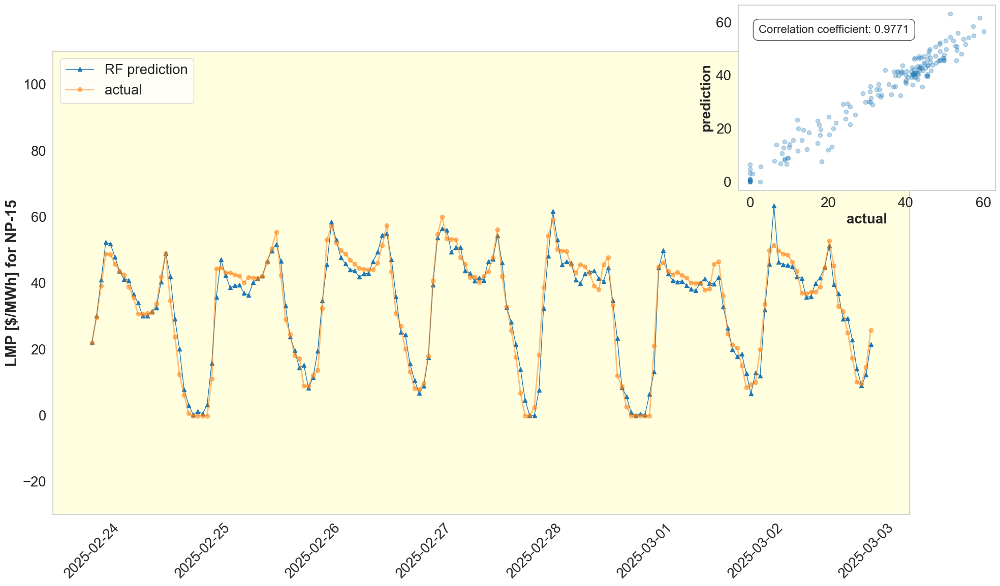

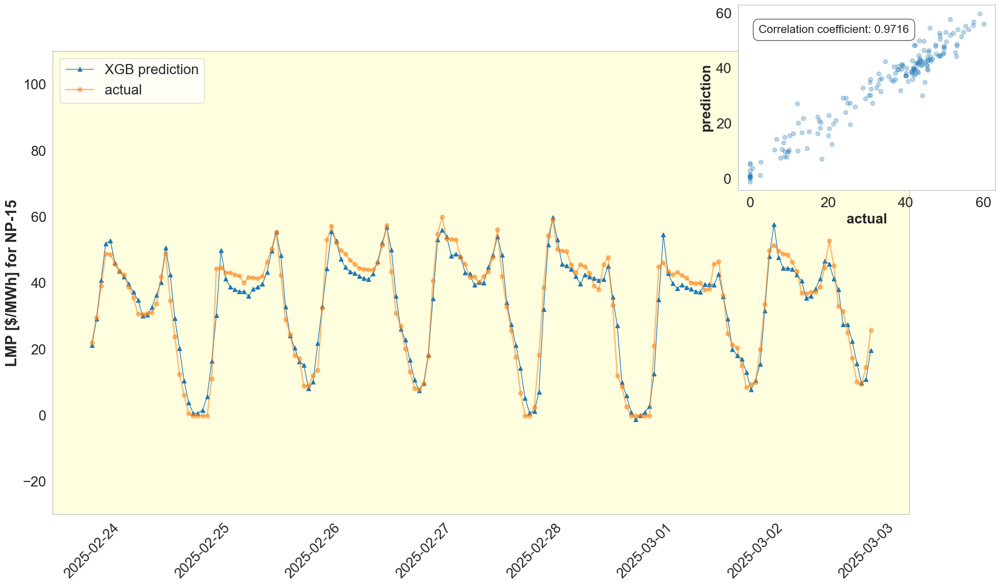

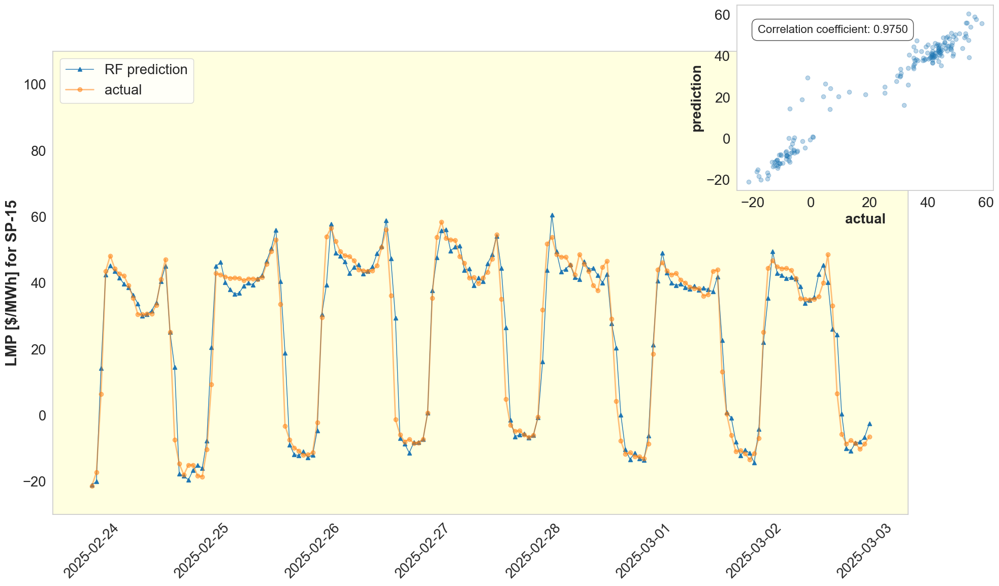

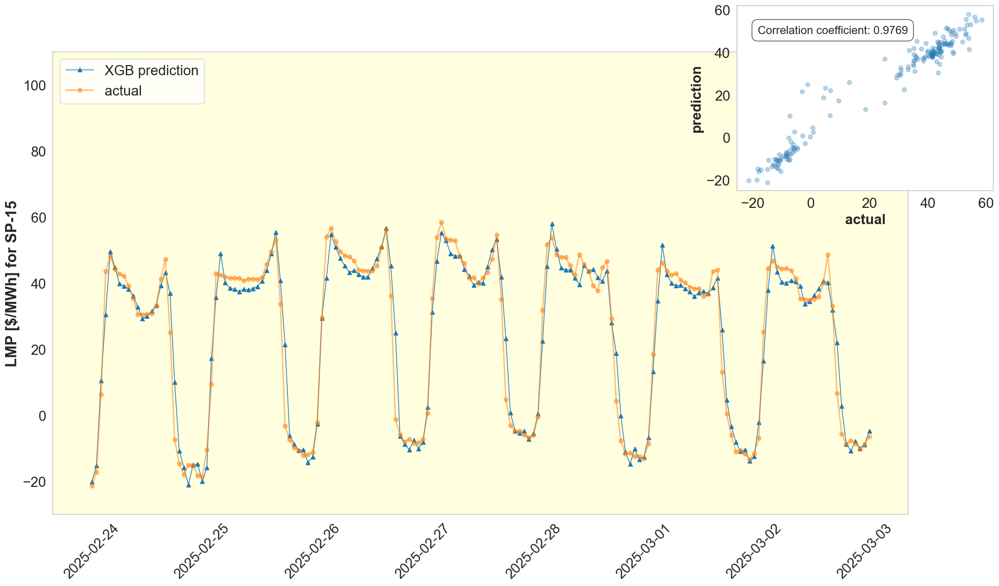

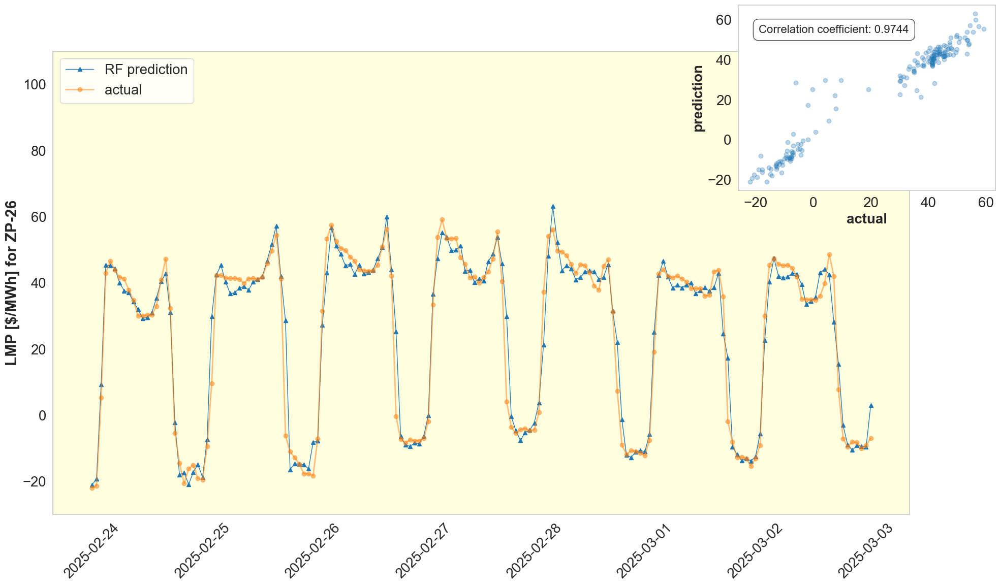

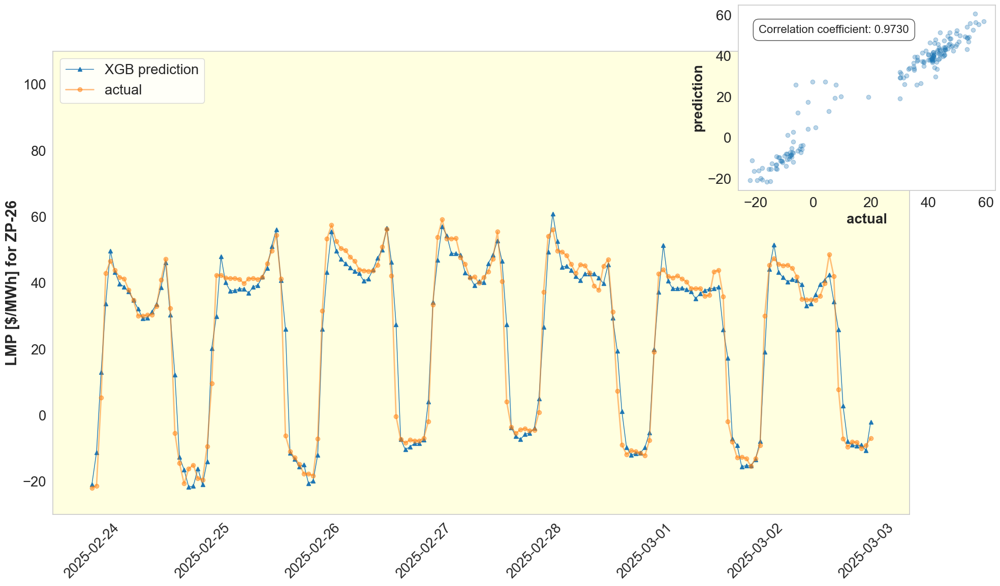

In [10]:
models = ['RF', 'XGB']
name_pr = 'Simple_'

for j in np.arange(len(areas)):  
    area = areas[j]

    for i in np.arange(len(models)):
        model = models[i]
        
        df = pd.read_csv(file_path + name_pr + model + '_' + area + '.csv', index_col='Unnamed: 0')
        df.index = pd.to_datetime(df.index)

        plot_comp1(df, 'Actual', 'Prediction', 'actual', 'prediction', name_pr, model, area, y_lims=[-30, 110], ylabel='LMP [$/MWh]', status='modified')

### Simple models: Visualized together

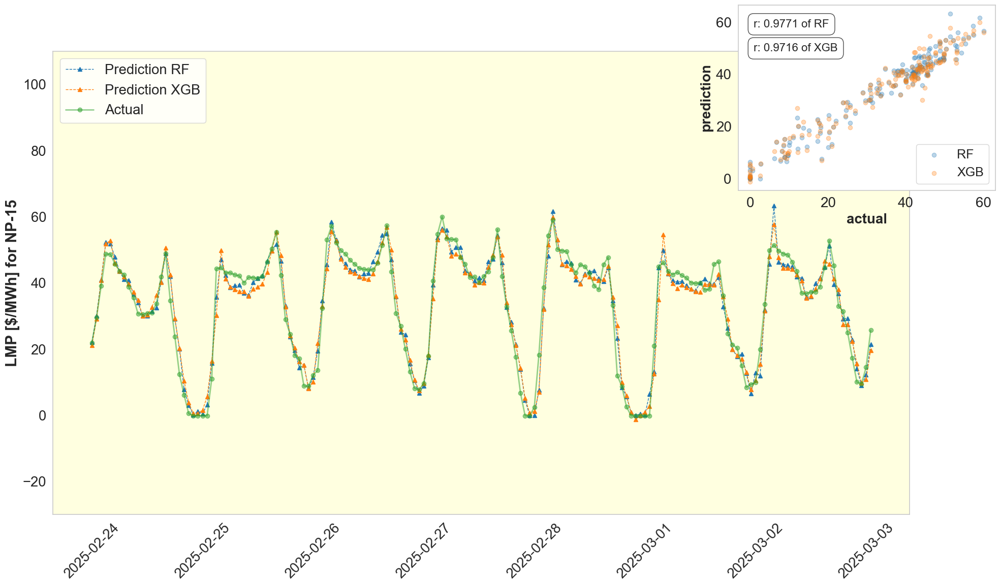

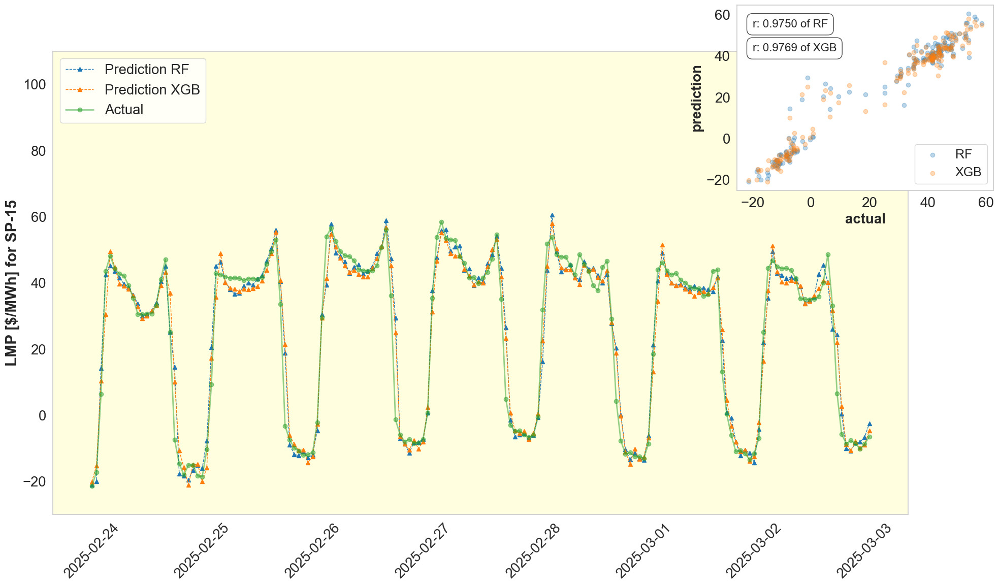

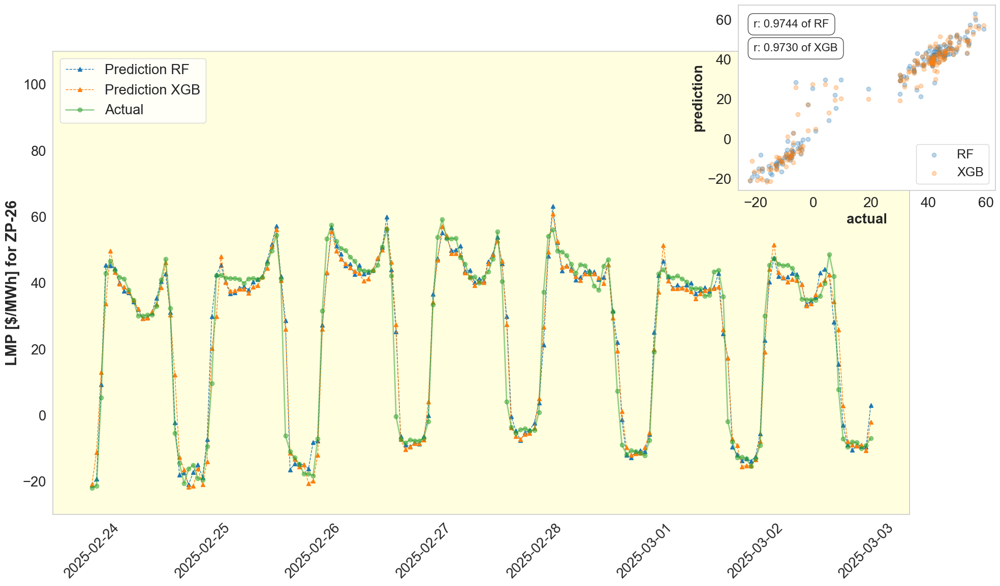

In [12]:
models = ['RF', 'XGB']
name_pr = 'Simple_'

for j in np.arange(len(areas)):  
    area = areas[j]
    
    actual_predictions = {}
    
    for i in np.arange(len(models)):
        
        model = models[i]
        
        df = pd.read_csv(file_path + name_pr + model + '_' + area + '.csv', index_col='Unnamed: 0')
        df.index = pd.to_datetime(df.index)
        
        actual_predictions[f'Actual_{model}'] = df['Actual']
        actual_predictions[f'Prediction_{model}'] = df['Prediction']
    
    area_df = pd.DataFrame(actual_predictions)
    plot_comp2(area_df, area, name_pr, models, y_lims=[-30, 110], ylabel='LMP [$/MWh]', status='modified')

### Models with enhanced features: Visualized separately
RF and XGBoost models

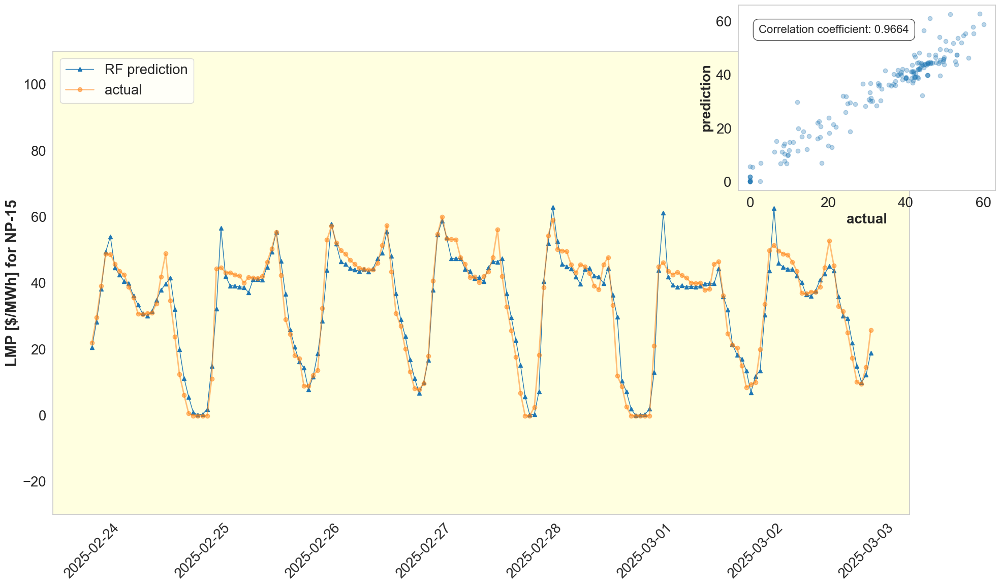

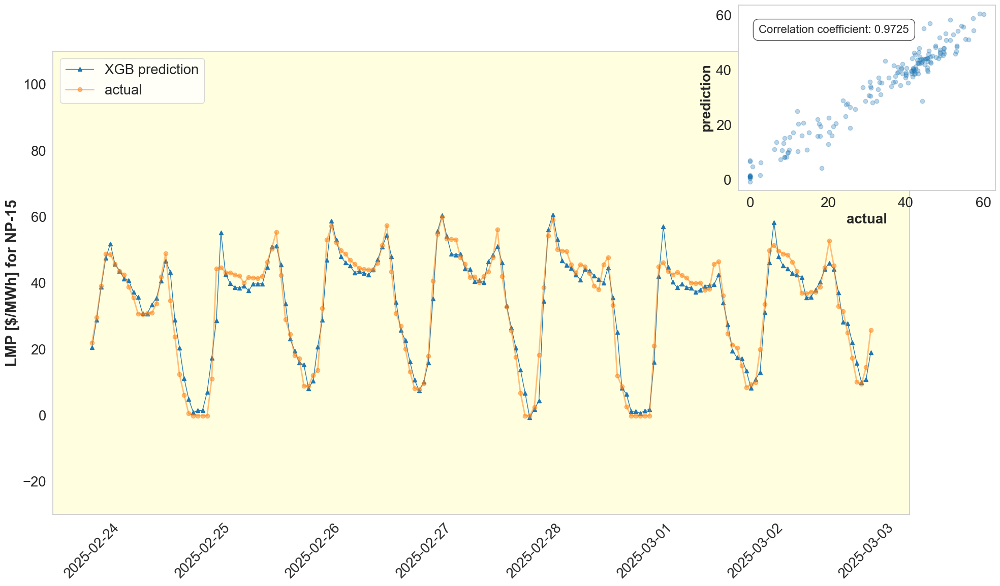

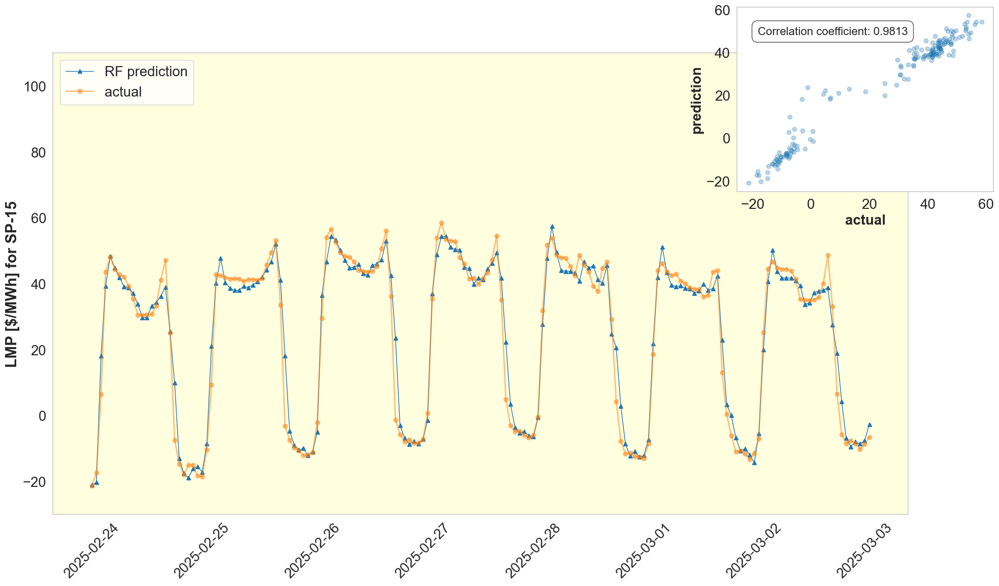

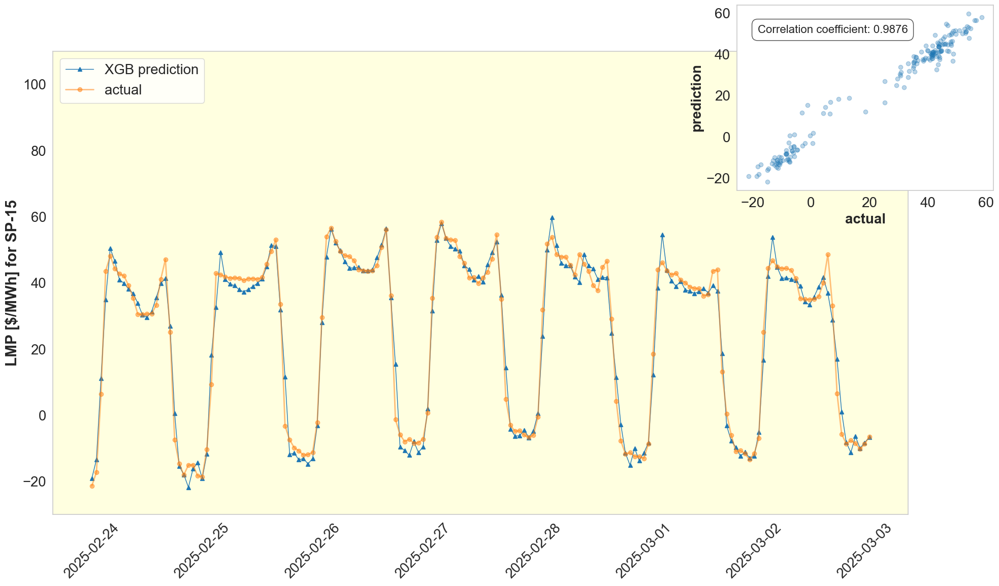

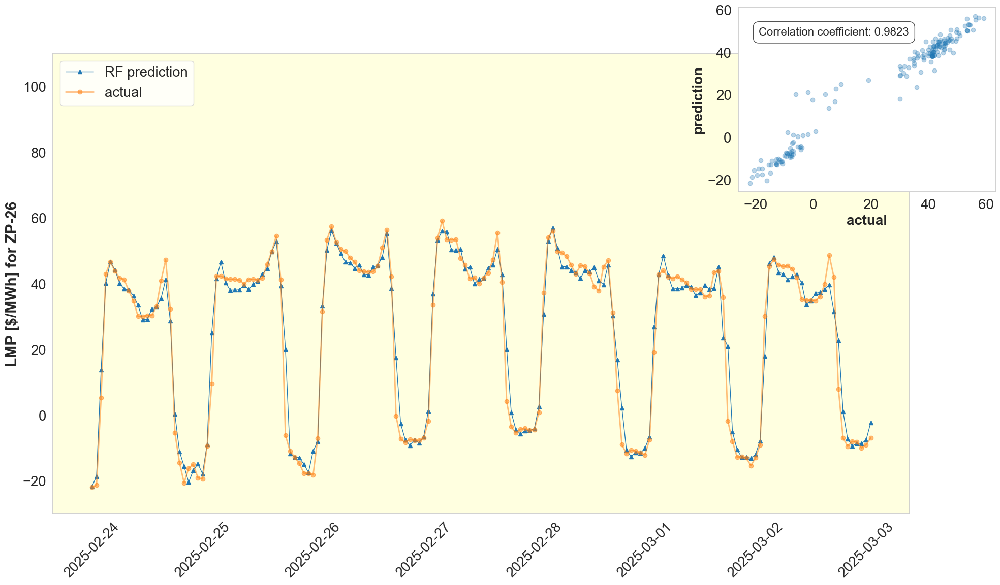

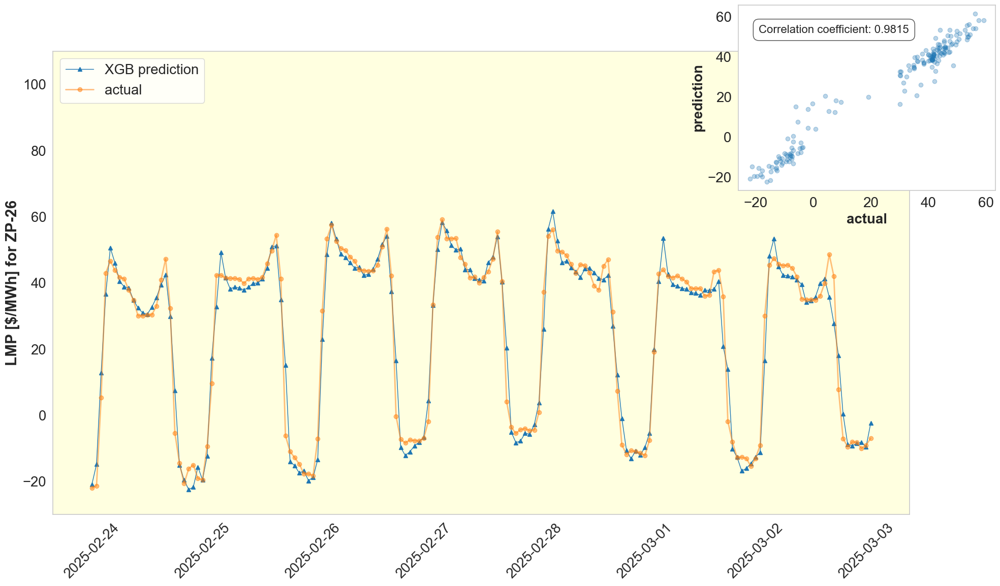

In [14]:
models = ['RF', 'XGB']
name_pr = 'Enhanced_features_'

for j in np.arange(len(areas)):  
    area = areas[j]

    for i in np.arange(len(models)):
        model = models[i]
        
        df = pd.read_csv(file_path + name_pr + model + '_' + area + '.csv', index_col='Unnamed: 0')
        df.index = pd.to_datetime(df.index)

        plot_comp1(df, 'Actual', 'Prediction', 'actual', 'prediction', name_pr, model, area, y_lims=[-30, 110], ylabel='LMP [$/MWh]', status='modified')

### Models with enhanced features: Visualized together
RF and XGBoost models

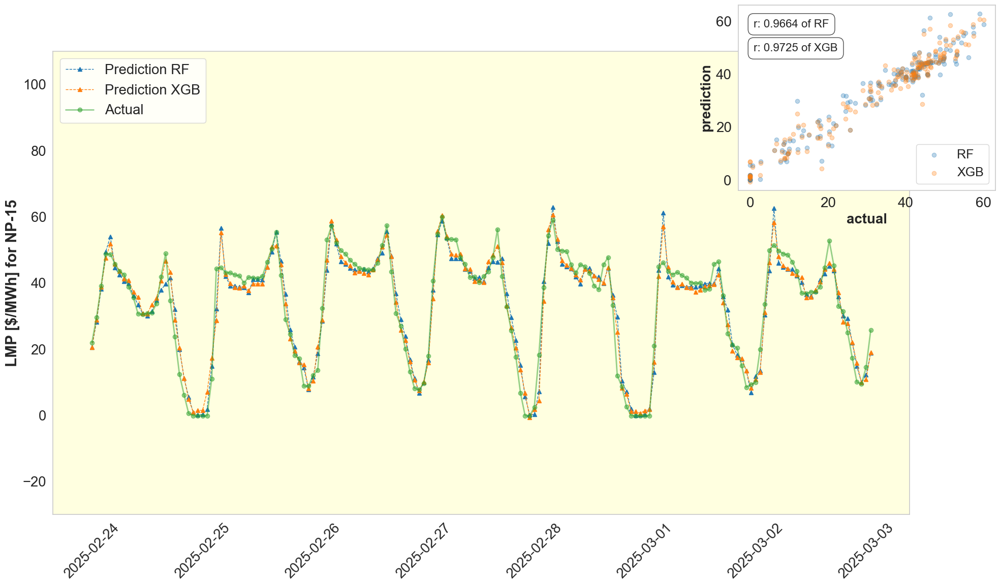

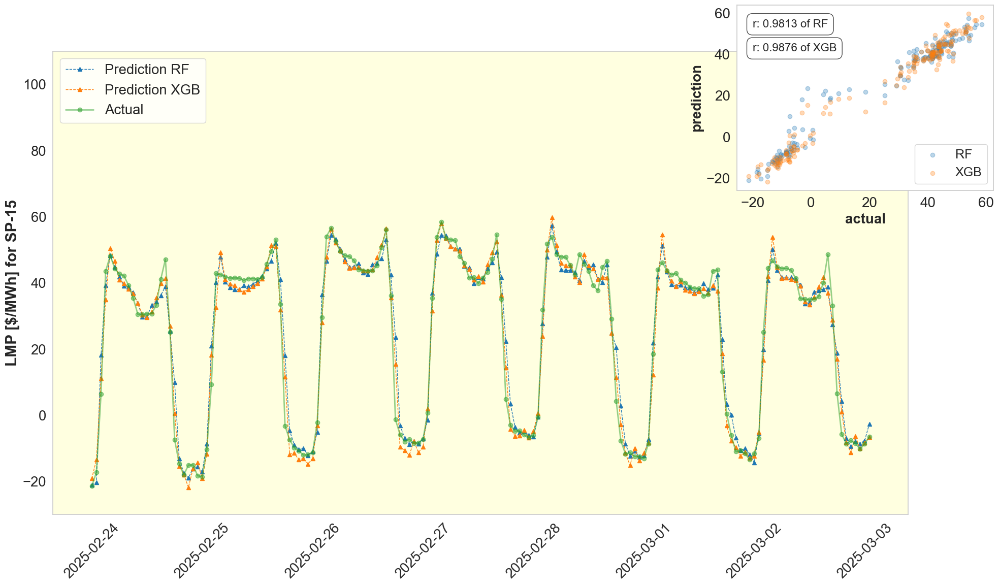

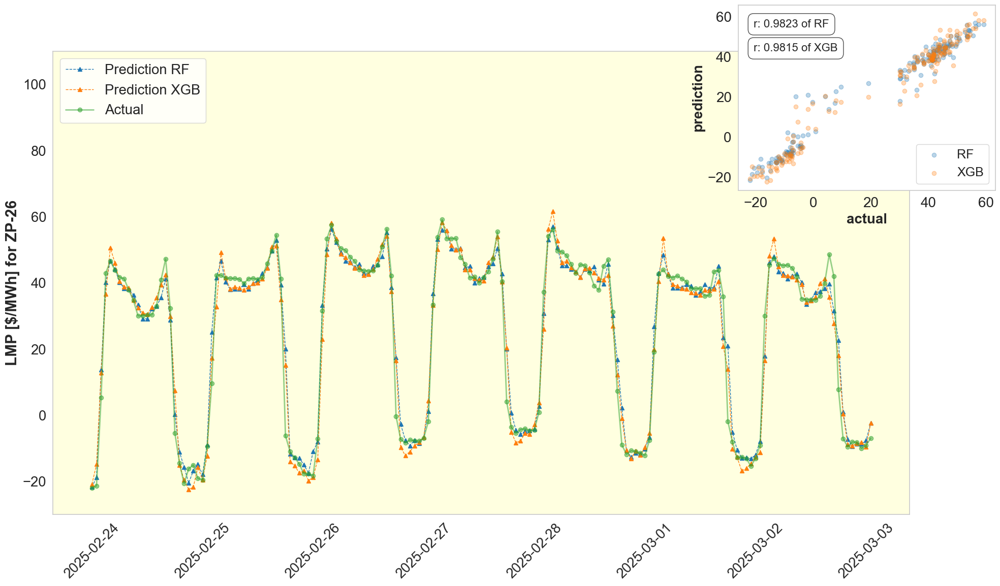

In [16]:
models = ['RF', 'XGB']
name_pr = 'Enhanced_features_'

for j in np.arange(len(areas)):  
    area = areas[j]
    
    actual_predictions = {}
    
    for i in np.arange(len(models)):
        
        model = models[i]
        
        df = pd.read_csv(file_path + name_pr + model + '_' + area + '.csv', index_col='Unnamed: 0')
        df.index = pd.to_datetime(df.index)
        
        actual_predictions[f'Actual_{model}'] = df['Actual']
        actual_predictions[f'Prediction_{model}'] = df['Prediction']
    
    area_df = pd.DataFrame(actual_predictions)
    plot_comp2(area_df, area, name_pr, models, y_lims=[-30, 110], ylabel='LMP [$/MWh]', status='modified')

### Models with volatility: Visualized separately
RF and XGBoost models

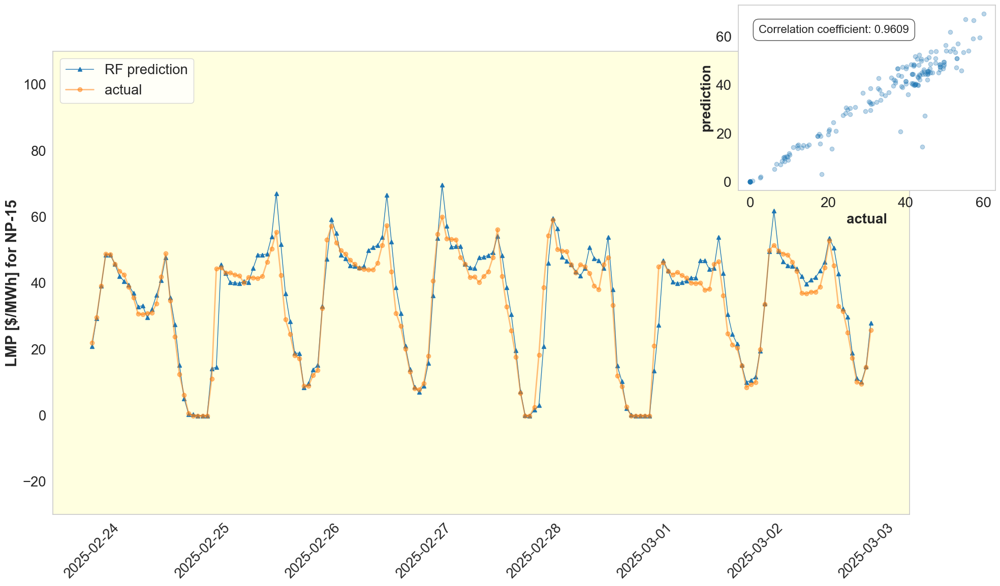

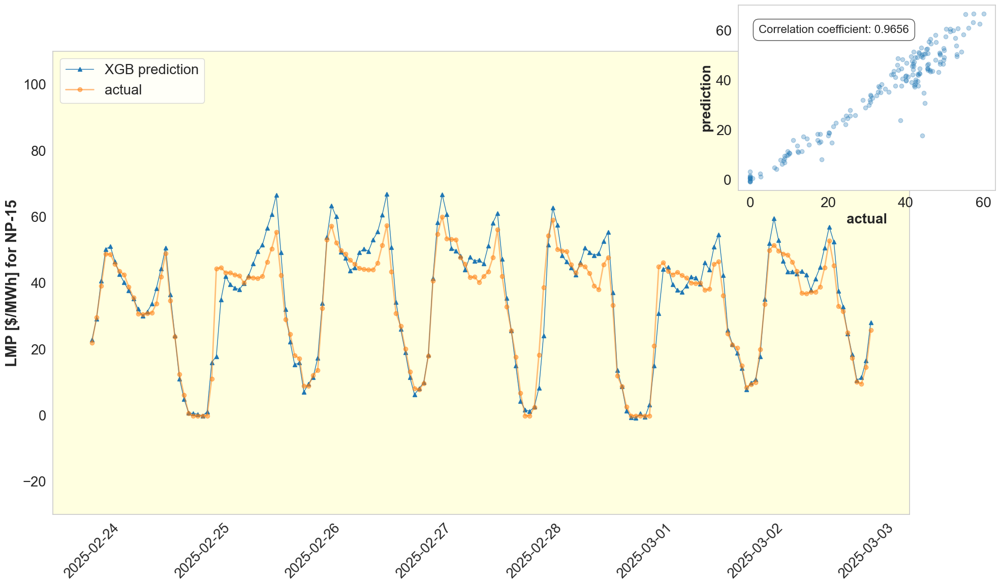

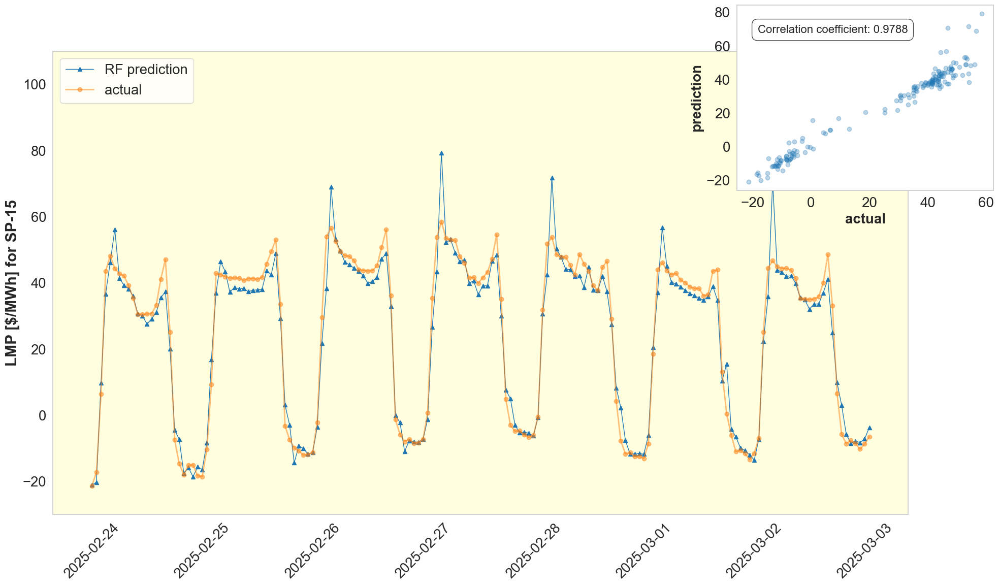

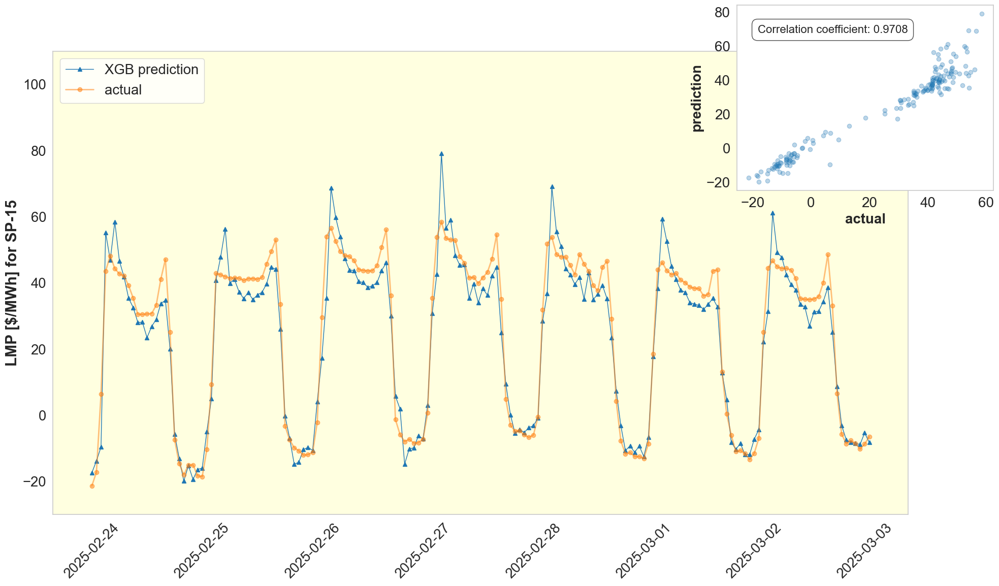

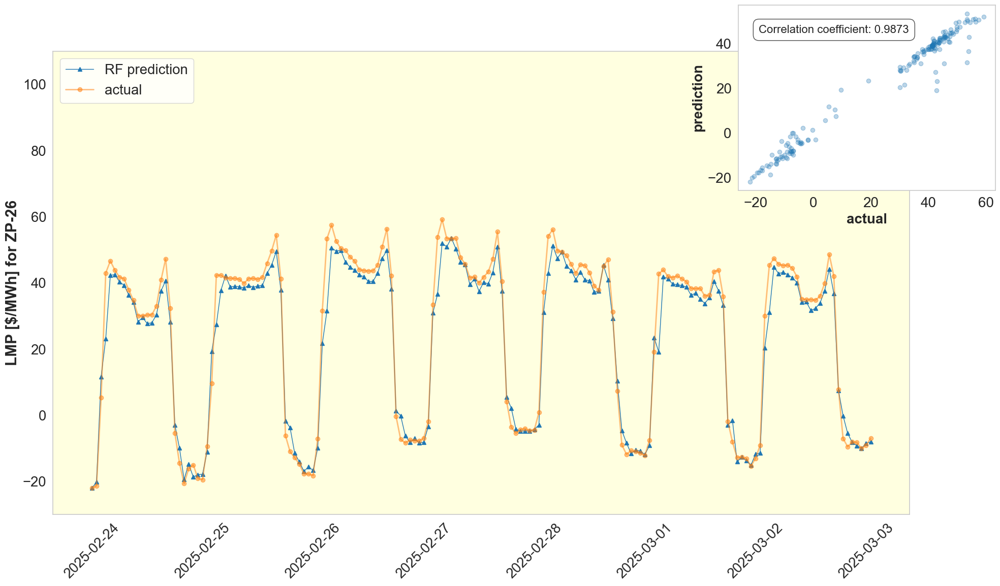

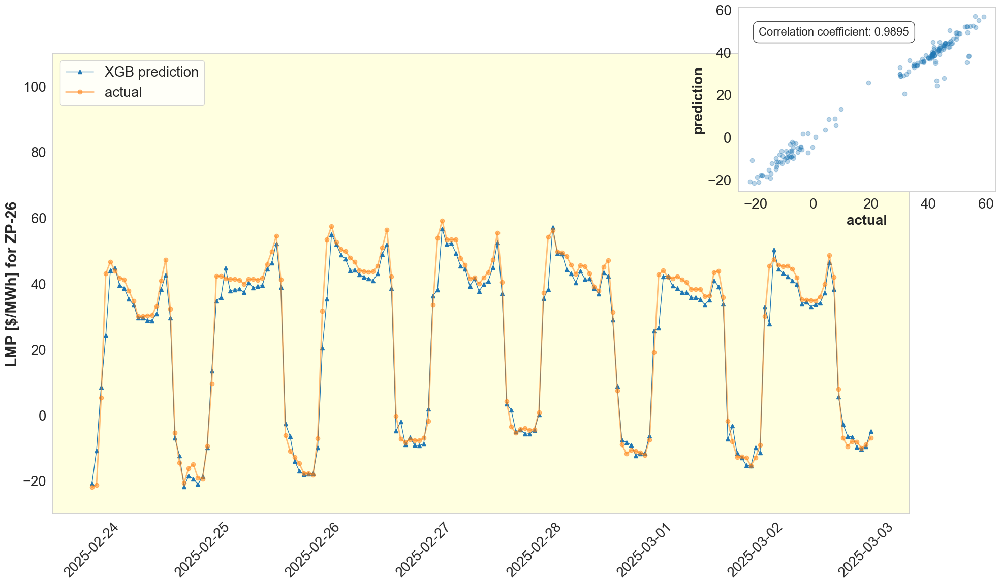

In [18]:
models = ['RF', 'XGB']
name_pr = 'Vol_'

for j in np.arange(len(areas)):  
    area = areas[j]

    for i in np.arange(len(models)):
        model = models[i]
        
        df = pd.read_csv(file_path + name_pr + model + '_' + area + '.csv', index_col='Unnamed: 0')
        df.index = pd.to_datetime(df.index)

        plot_comp1(df, 'Actual', 'Prediction', 'actual', 'prediction', name_pr, model, area, y_lims=[-30, 110], ylabel='LMP [$/MWh]', status='modified')

### Models with volatility: Visualized together
RF and XGBoost models

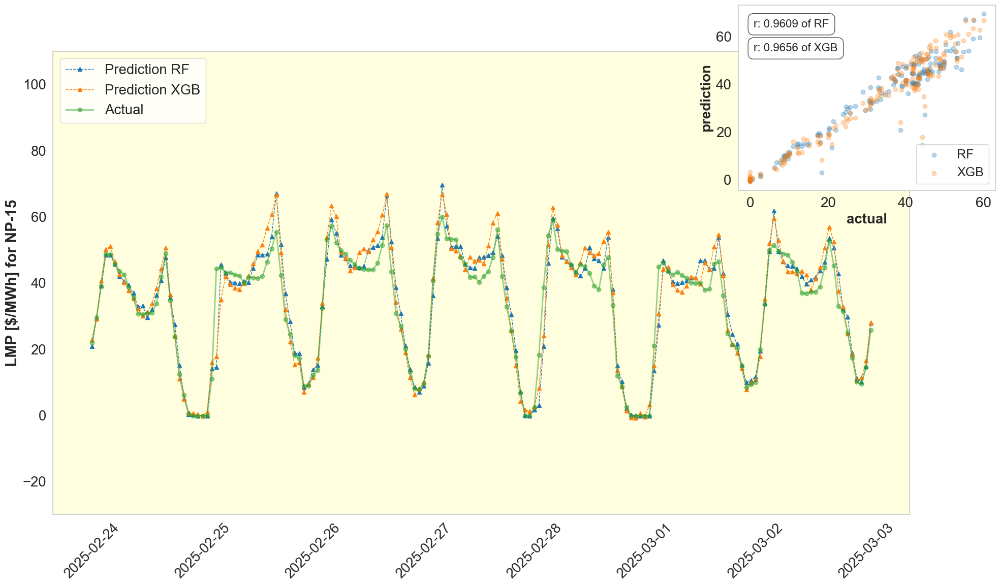

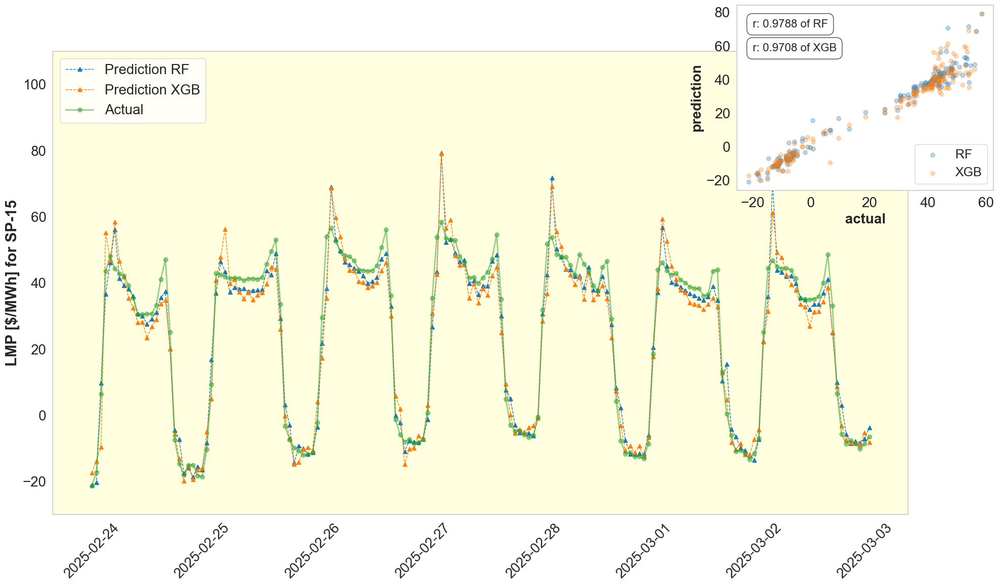

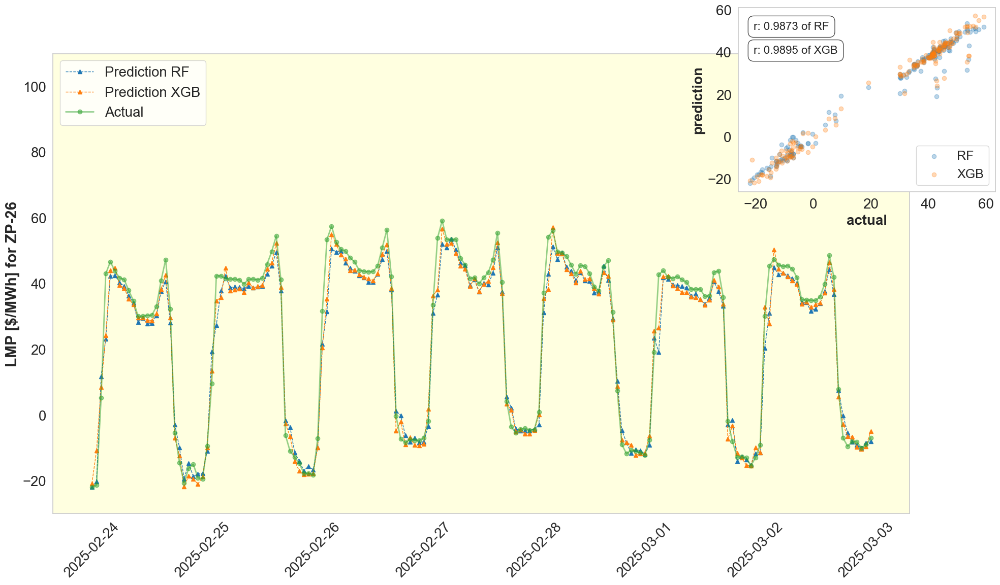

In [20]:
models = ['RF', 'XGB']
name_pr = 'Vol_'

for j in np.arange(len(areas)):  
    area = areas[j]
    
    actual_predictions = {}
    
    for i in np.arange(len(models)):
        
        model = models[i]
        
        df = pd.read_csv(file_path + name_pr + model + '_' + area + '.csv', index_col='Unnamed: 0')
        df.index = pd.to_datetime(df.index)
        
        actual_predictions[f'Actual_{model}'] = df['Actual']
        actual_predictions[f'Prediction_{model}'] = df['Prediction']
    
    area_df = pd.DataFrame(actual_predictions)
    plot_comp2(area_df, area, name_pr, models, y_lims=[-30, 110], ylabel='LMP [$/MWh]', status='modified')

### Compare result improvements through model succession: line plots

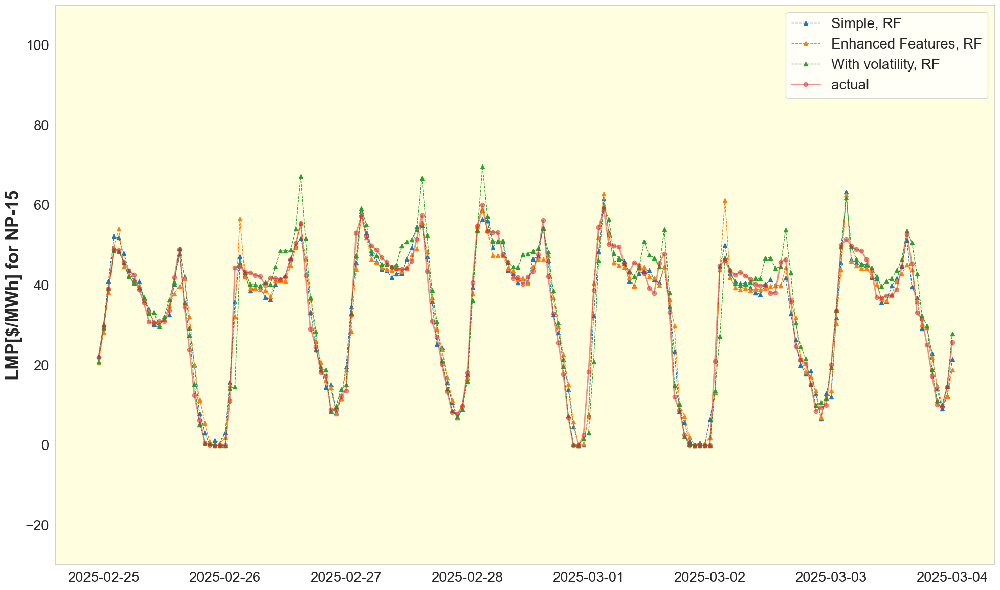

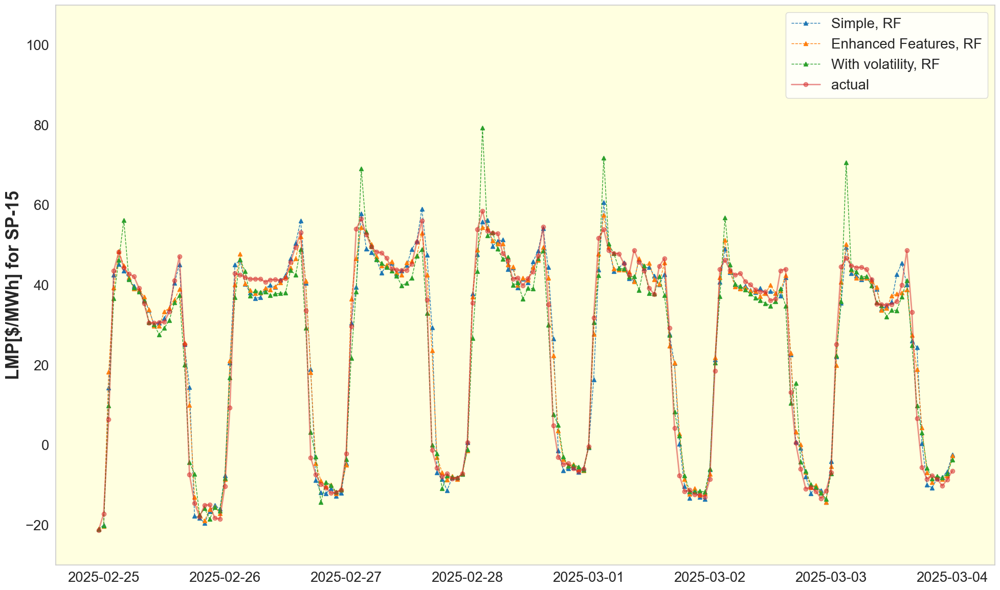

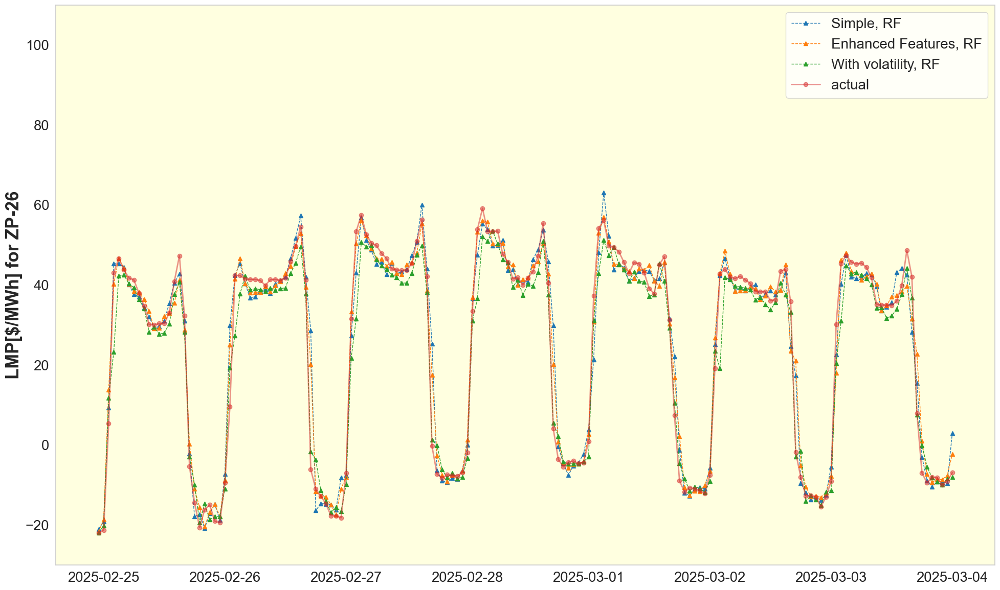

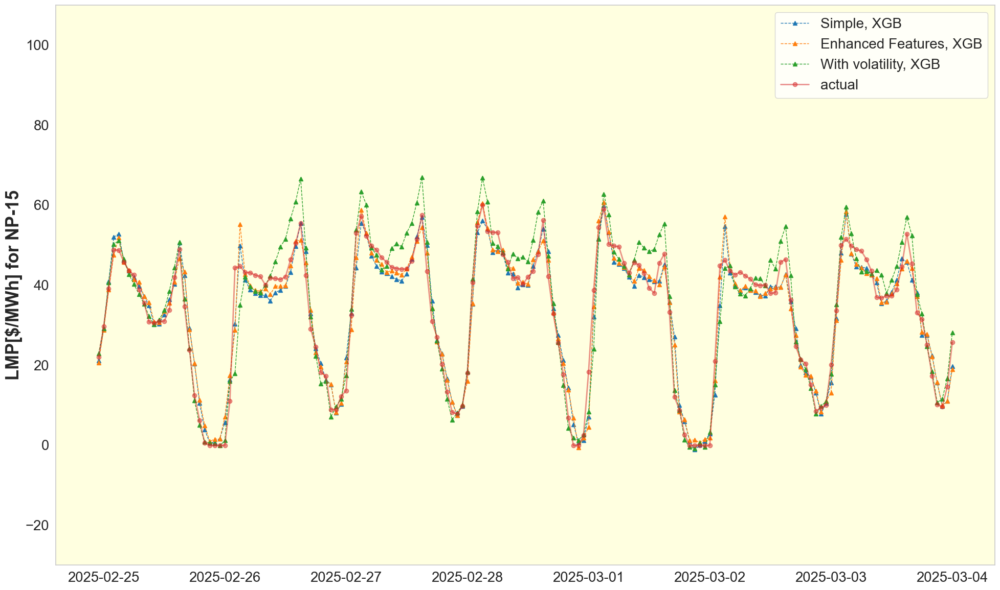

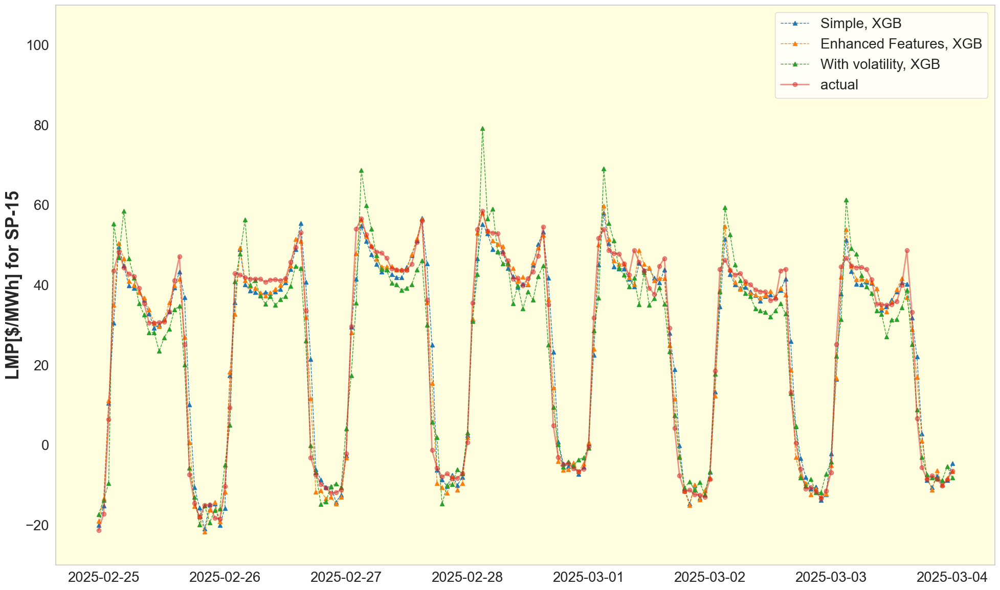

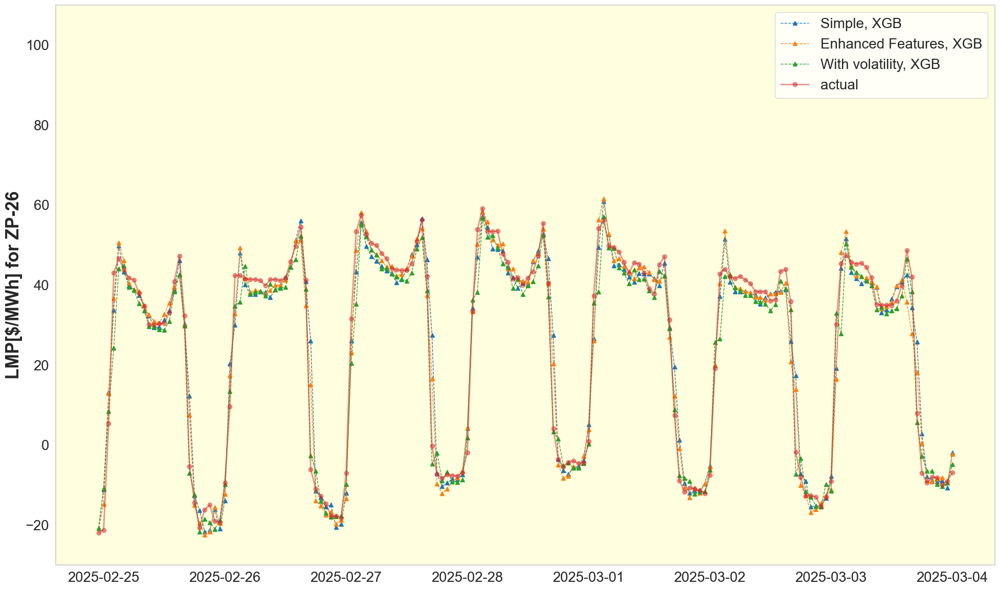

In [22]:
models = ['RF', 'XGB']
name_prs = ['Simple_', 'Enhanced_features_', 'Vol_']
mss = ['Simple', 'Enhanced Features', 'With volatility']
status = "modified"
name = "individual_line"

for i in np.arange(len(models)):
    model = models[i]

    for j in np.arange(len(areas)):
        area = areas[j]

        comp_individual_succ_line(model, area, name_prs, mss, file_path, status, name)        

### Compare result improvements through model succession: scatter plots

Simple model vs Enhanced features (scatter-1)

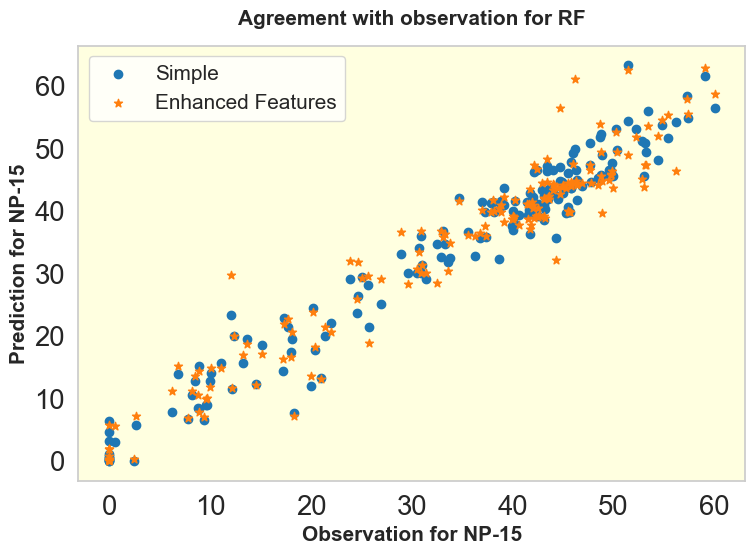

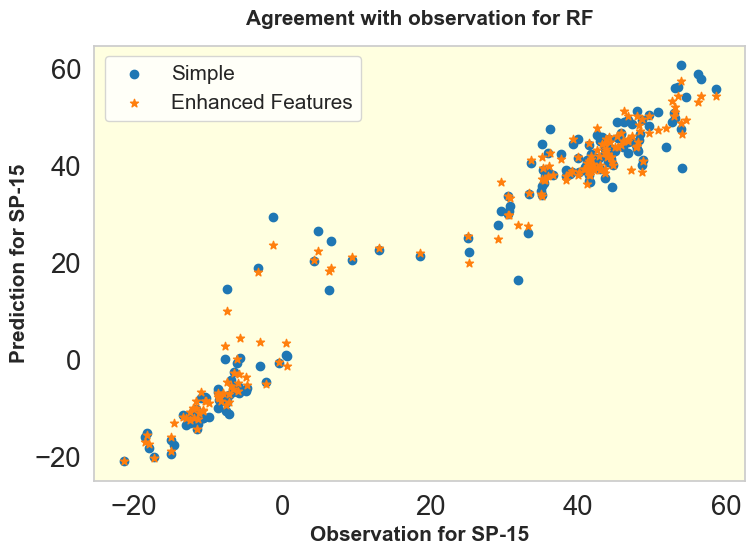

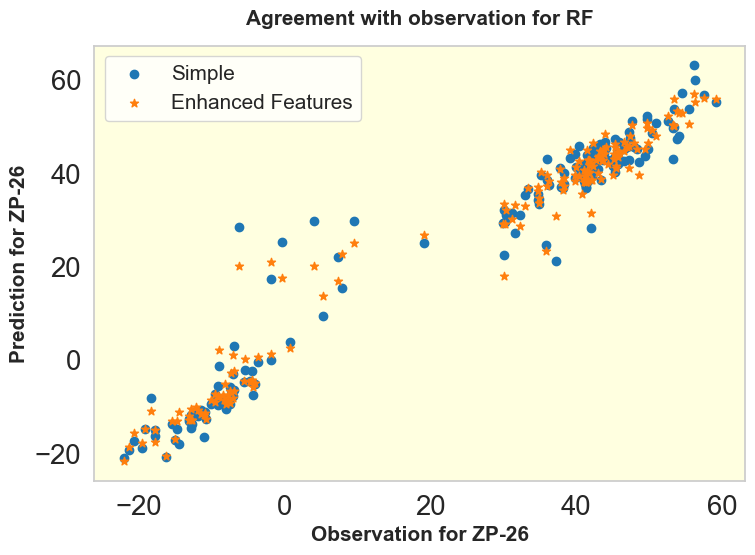

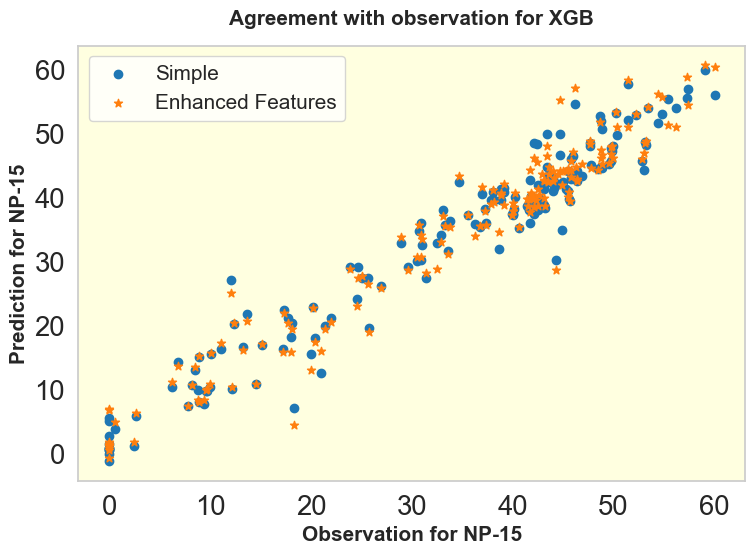

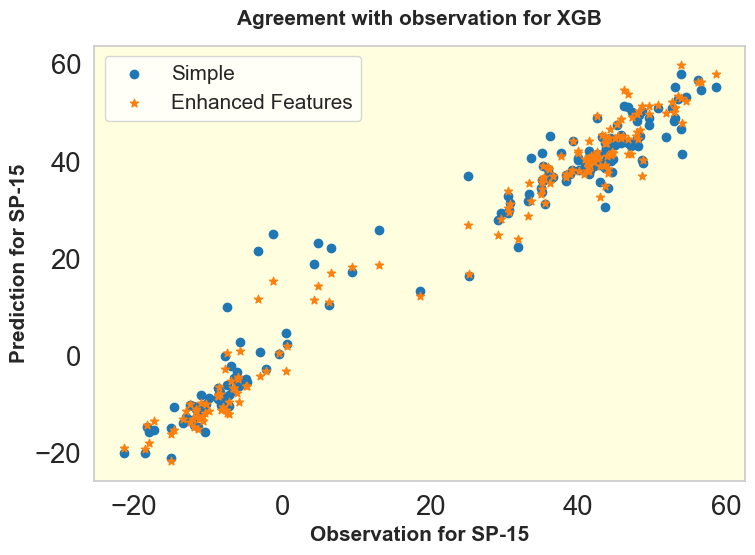

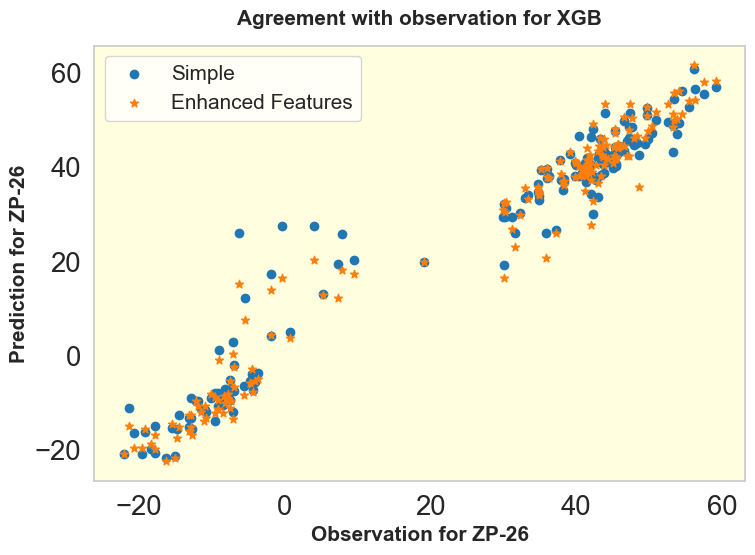

In [24]:
models = ['RF', 'XGB']
name_prs = ['Simple_', 'Enhanced_features_']
mss = ['Simple', 'Enhanced Features']
status = "modified"
name = "individual_scatter1"

for i in np.arange(len(models)):
    model = models[i]

    for j in np.arange(len(areas)):
        area = areas[j]
        
        comp_individual_succ_scatter(model, area, name_prs, mss, file_path, status, name)

### Compare result improvements through model succession: scatter plots

Simple model vs Enhanced features with volatility (scatter2)

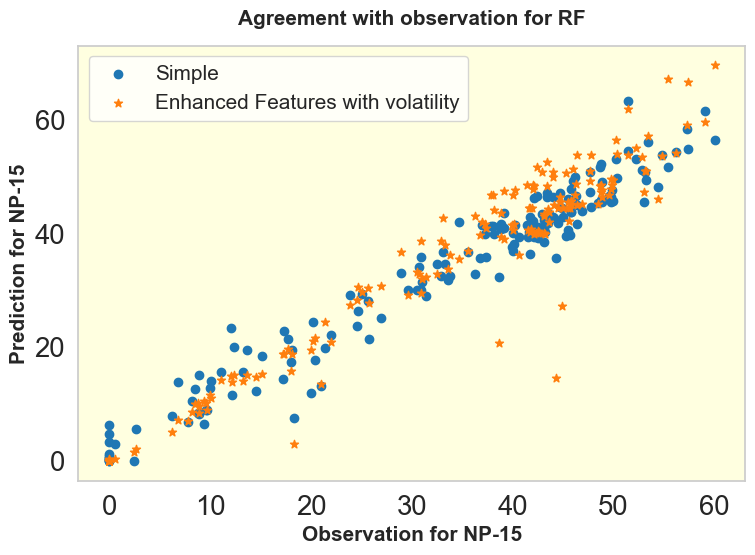

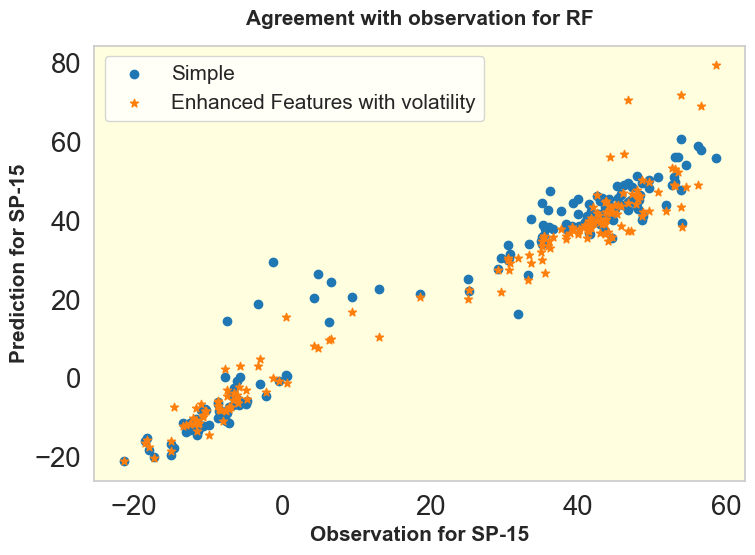

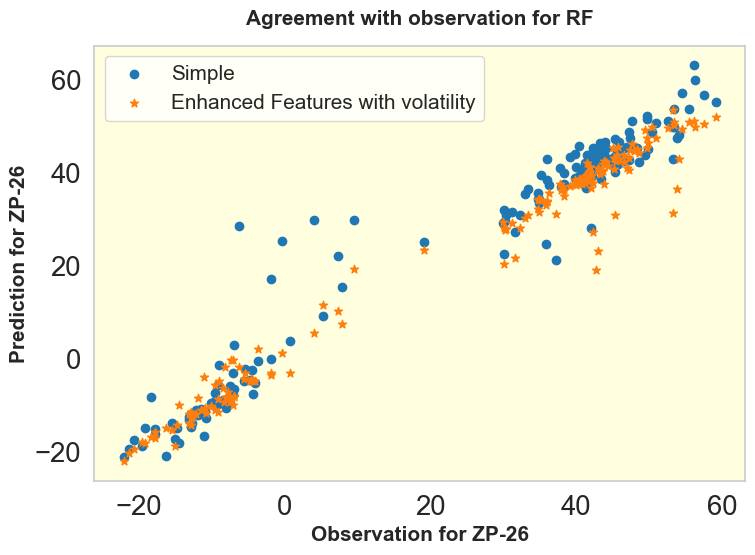

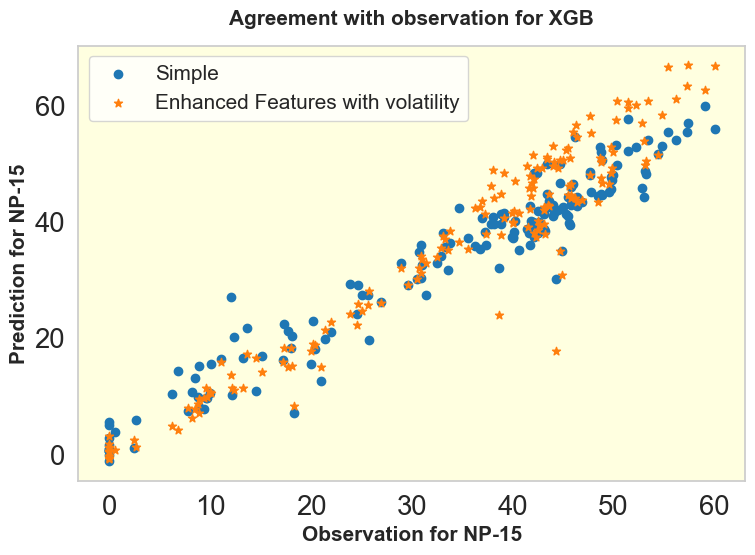

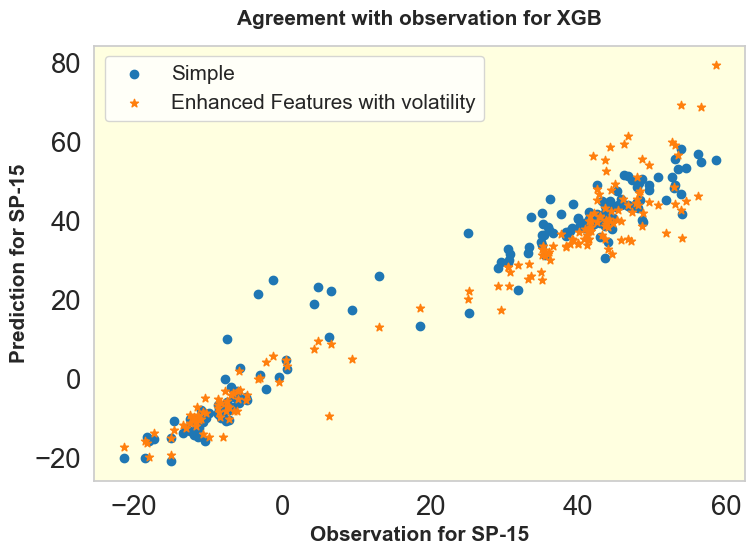

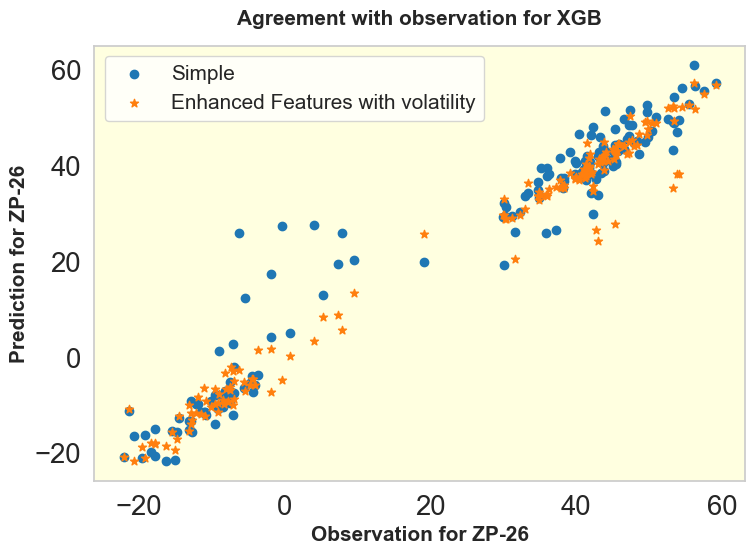

In [26]:
models = ['RF', 'XGB']
name_prs = ['Simple_', 'Vol_']
mss = ['Simple', 'Enhanced Features with volatility']
status = "modified"
name = "individual_scatter2"

for i in np.arange(len(models)):
    model = models[i]

    for j in np.arange(len(areas)):
        area = areas[j]

        comp_individual_succ_scatter(model, area, name_prs, mss, file_path, status, name)

### Compare result improvements through model succession: scatter plots

Enhanced features without volatility vs Enhanced features with volatility (scatter-3)

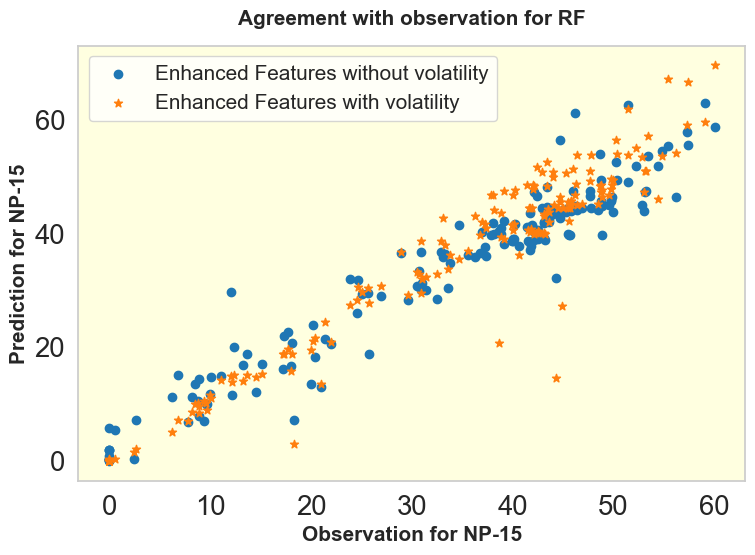

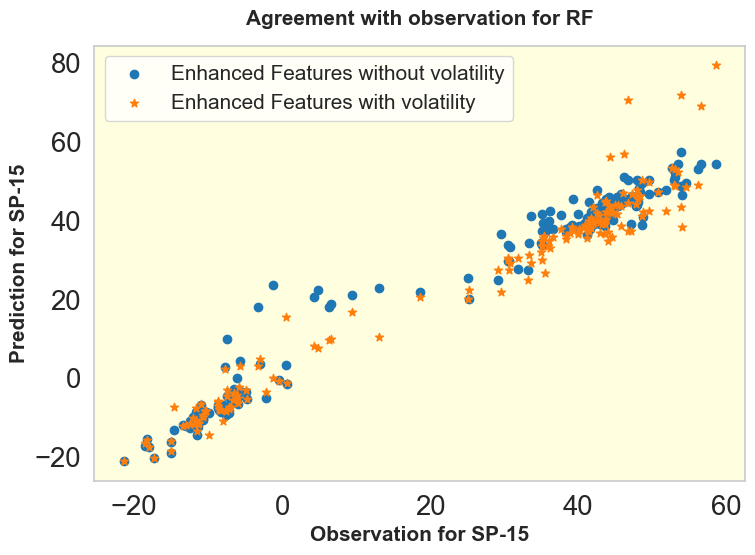

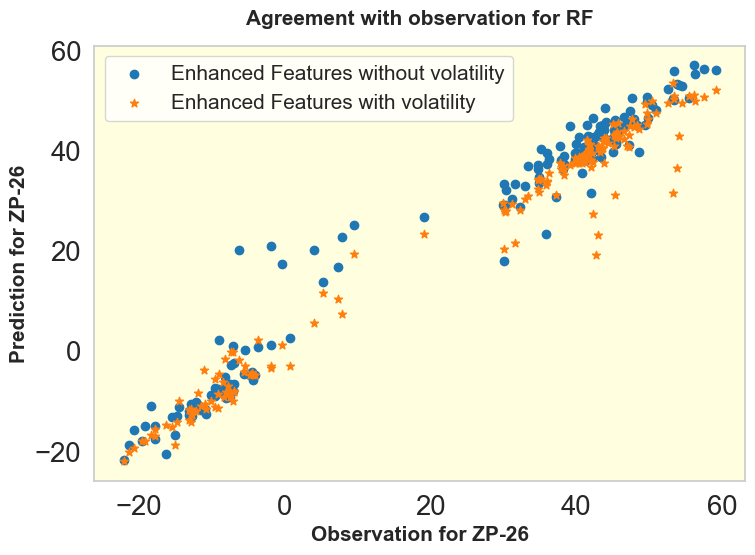

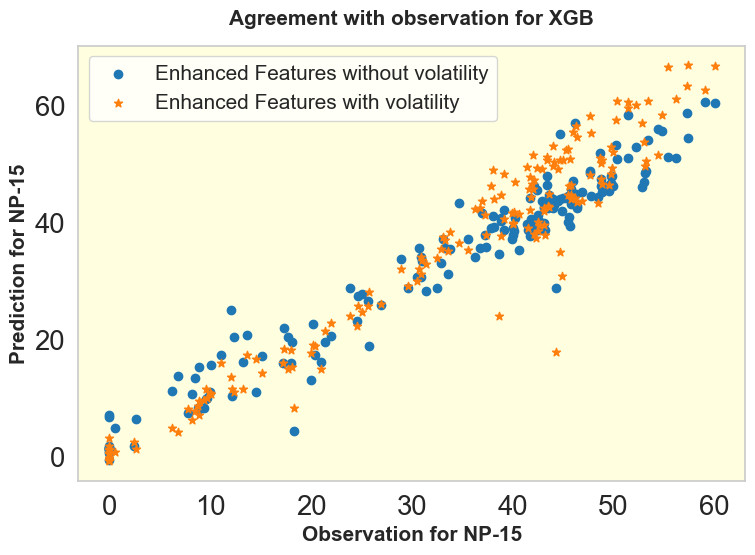

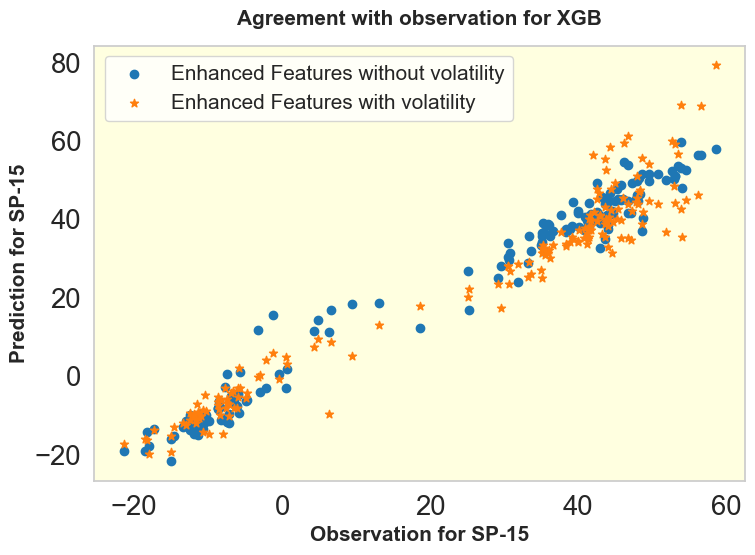

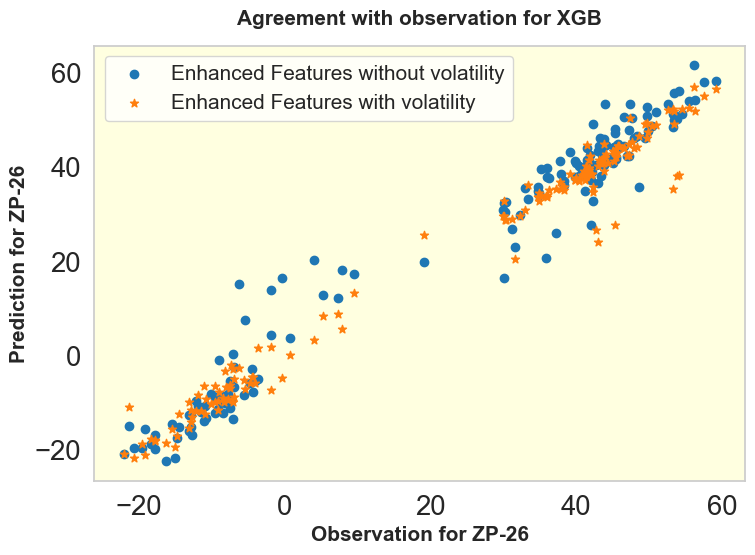

In [28]:
models = ['RF', 'XGB']
name_prs = ['Enhanced_features_', 'Vol_']
mss = ['Enhanced Features without volatility', 'Enhanced Features with volatility']
status = "modified"
name = "individual_scatter3"

for i in np.arange(len(models)):
    model = models[i]

    for j in np.arange(len(areas)):
        area = areas[j]

        comp_individual_succ_scatter(model, area, name_prs, mss, file_path, status, name)

### Compare result improvements through model succession: scatter plots

All plots together

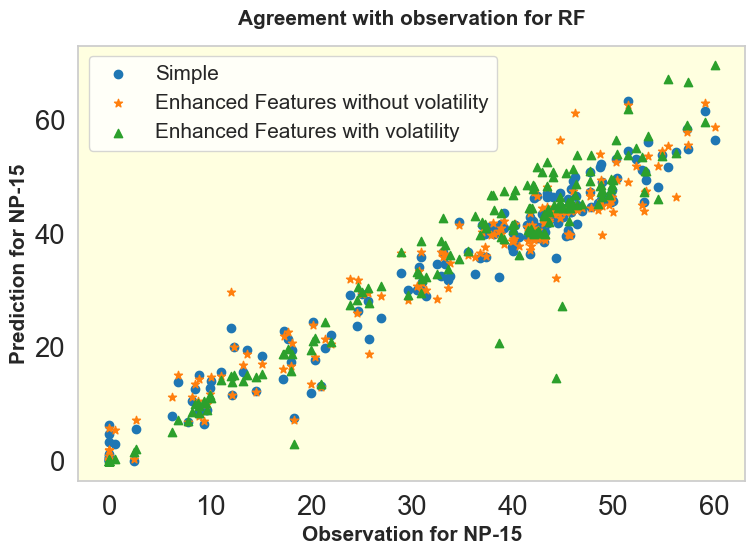

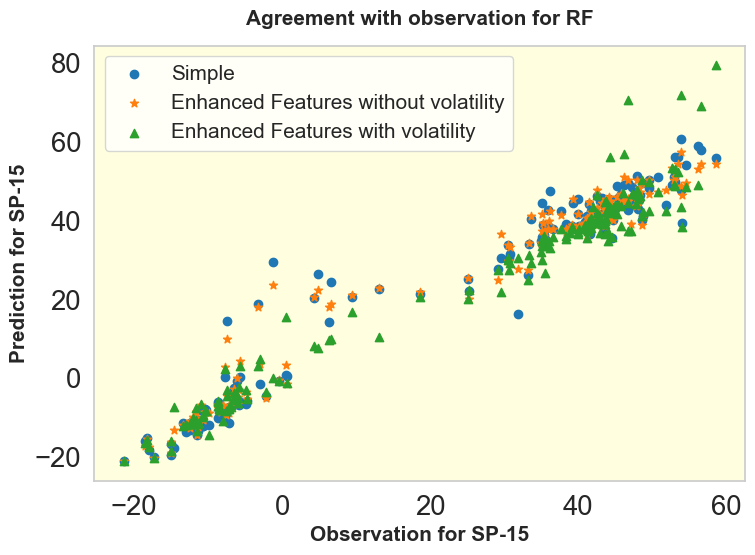

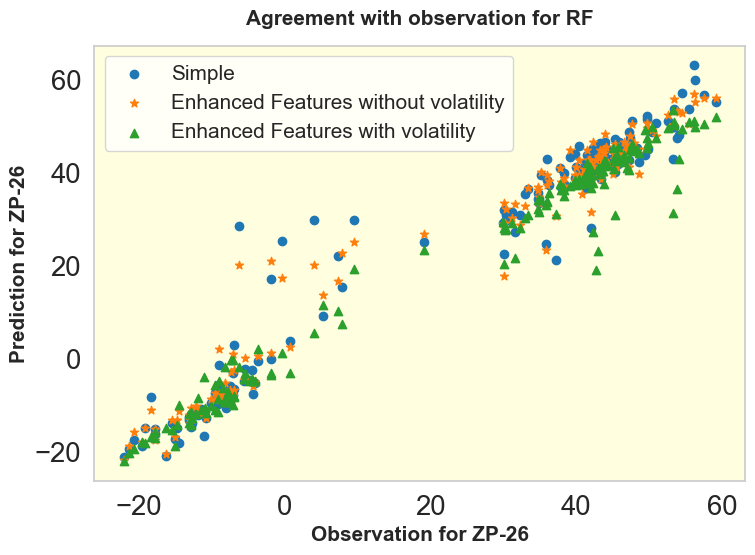

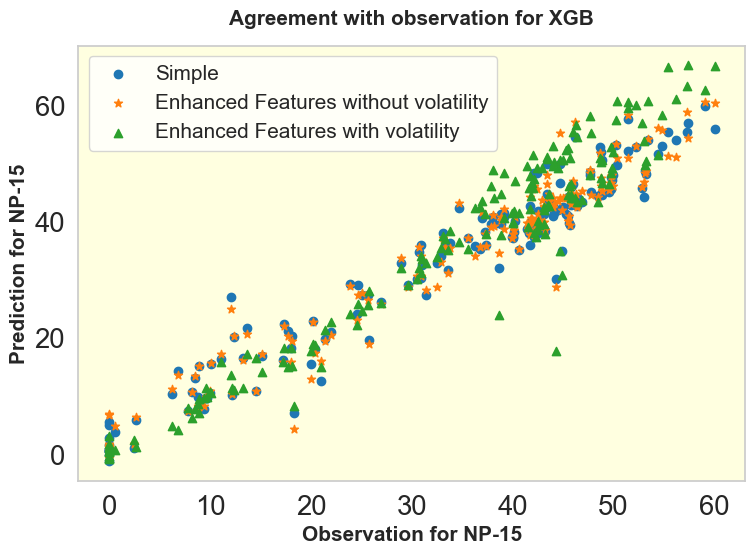

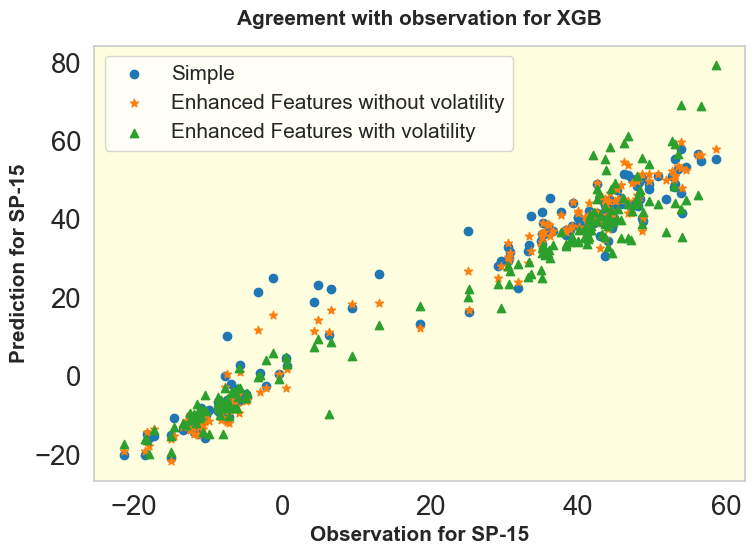

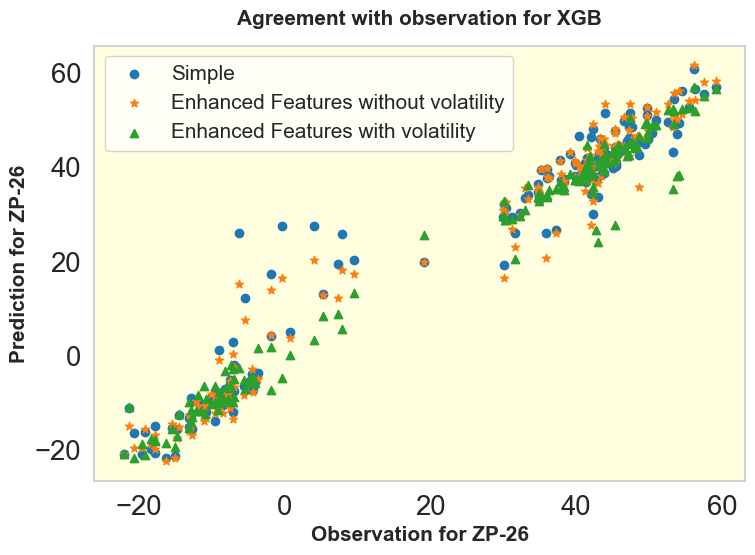

In [30]:
models = ['RF', 'XGB']
name_prs = ['Simple_', 'Enhanced_features_', 'Vol_']
mss = ['Simple', 'Enhanced Features without volatility', 'Enhanced Features with volatility']
status = "modified"
name = "individual_scatter_all"

for i in np.arange(len(models)):
    model = models[i]

    for j in np.arange(len(areas)):
        area = areas[j]

        comp_individual_succ_scatter(model, area, name_prs, mss, file_path, status, name)

### Individual barplots

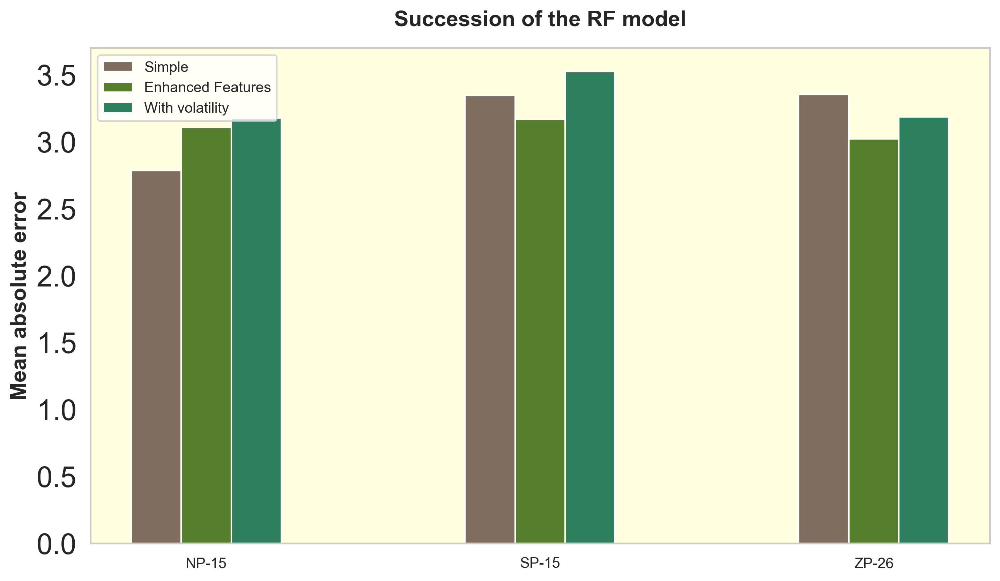

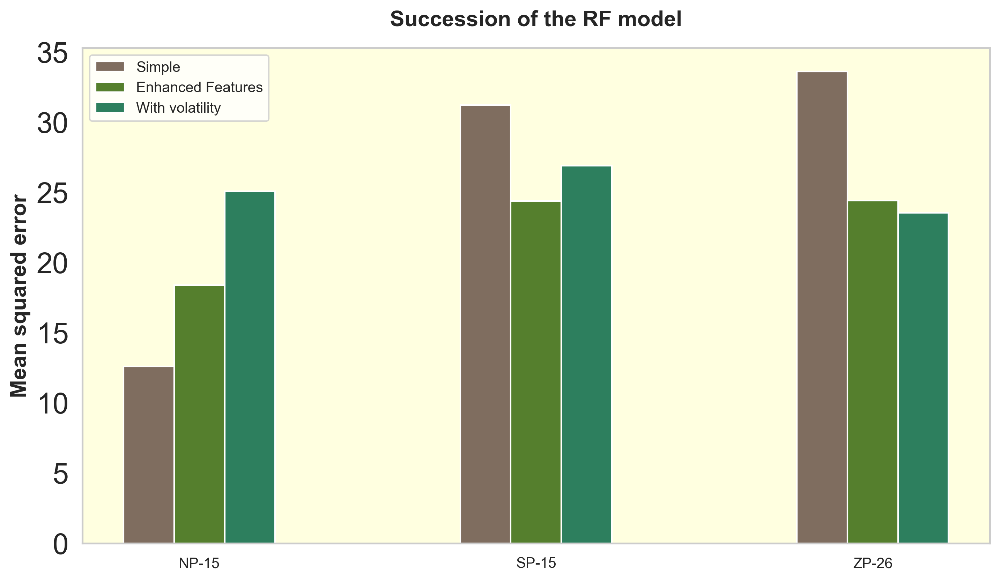

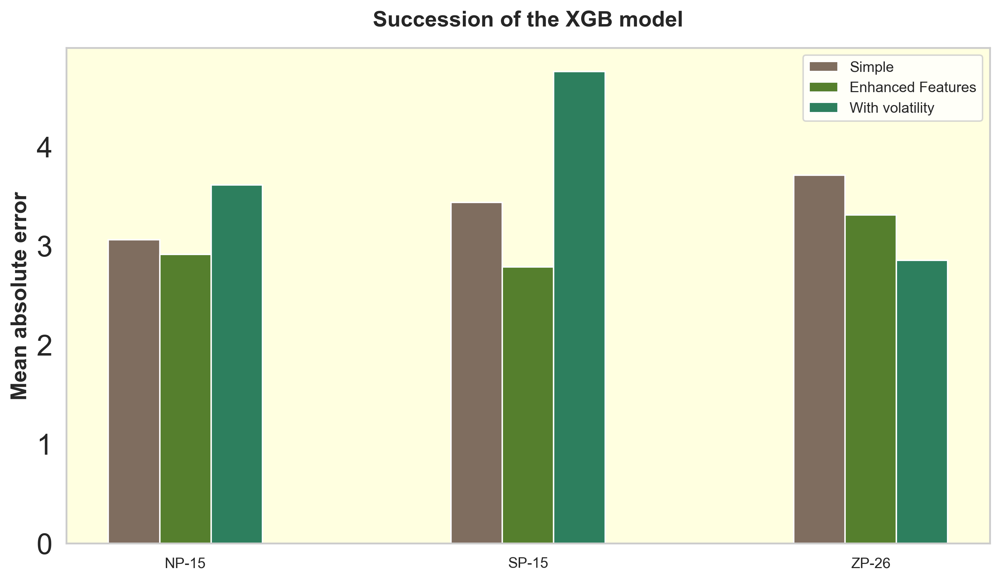

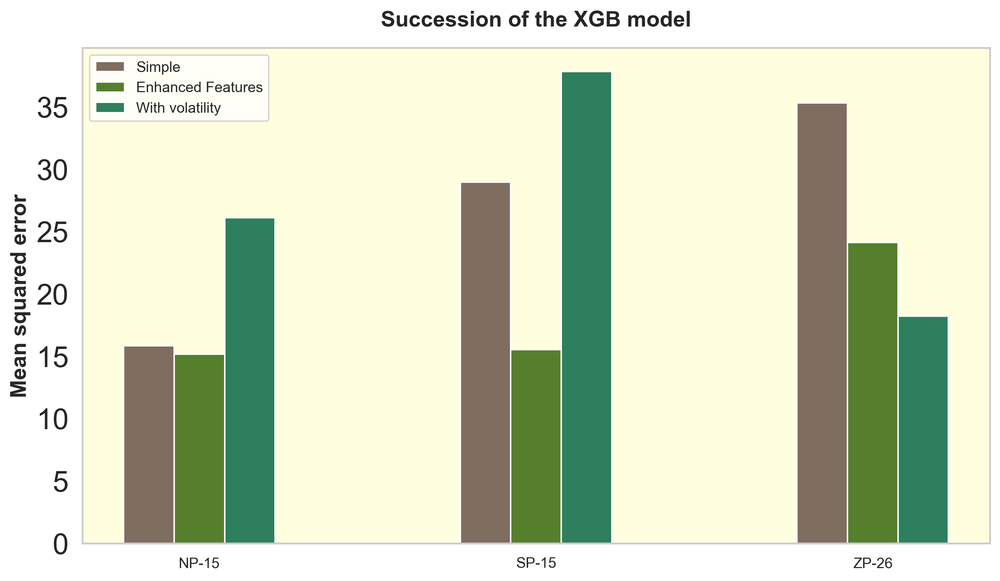

In [32]:
models = ['RF', 'XGB']
name_prs = ['Simple_', 'Enhanced_features_', 'Vol_']
mss = ['Simple', 'Enhanced Features', 'With volatility']

for i in np.arange(len(models)):
    model = models[i]

    get_individual_barplots(file_path, name_prs, mss, areas, model, 'mae', 'Mean absolute error', var1='Actual', var2='Prediction', barWidth=barWidth, status='modified')
    get_individual_barplots(file_path, name_prs, mss, areas, model, 'mse', 'Mean squared error', var1='Actual', var2='Prediction', barWidth=barWidth, status='modified')

# Combined models

### RF & XGBoost Models combined to
    - Ensemble model
    - Stacked model
    - Stacked model with volatility

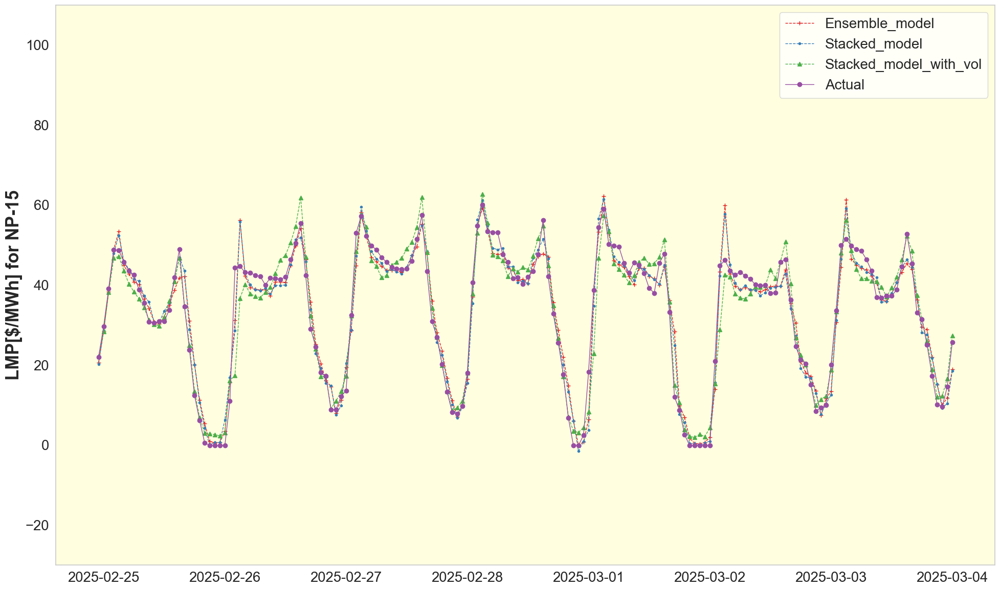

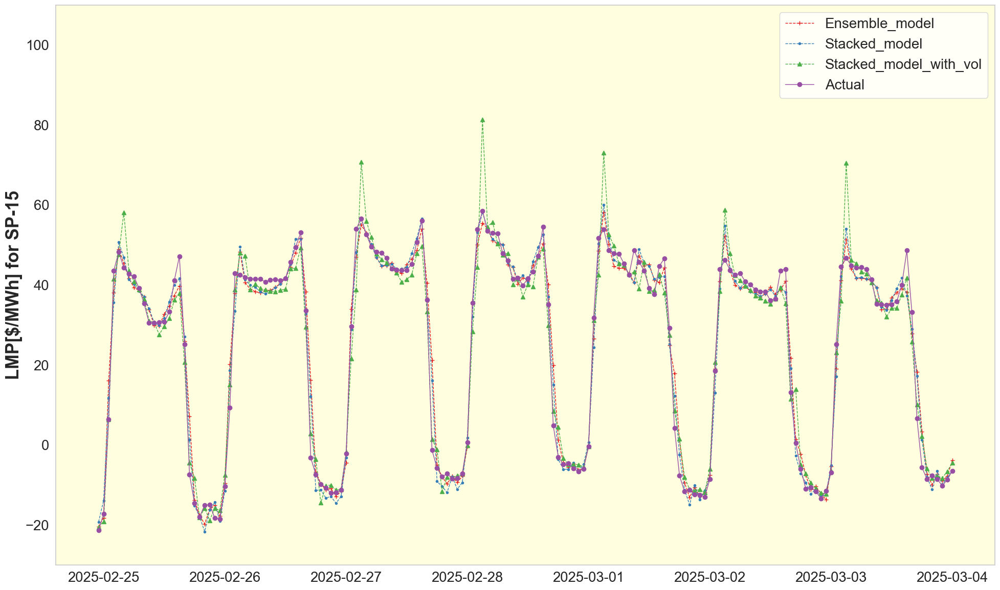

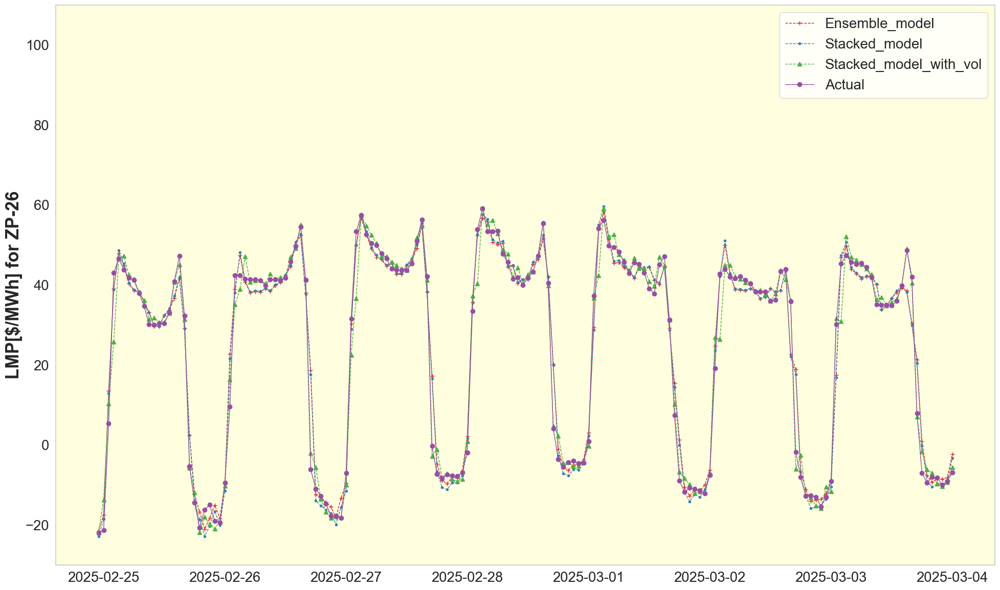

In [78]:
name_prs = ['Ensemble_model', 'Stacked_model', 'Stacked_model_with_vol']
status = 'modified'

for j in np.arange(len(areas)):
    area = areas[j]

    fig, ax = plt.subplots(figsize=(20,12))

    for k in np.arange(len(name_prs)):
        name_pr = name_prs[k]

        df = pd.read_csv(file_path + name_pr + '_' + area + '.csv', index_col='Unnamed: 0')
        df.index = pd.to_datetime(df.index)
        
        ax.plot(df['Prediction'], ls='--', marker=my_markers[k], lw=1, label=name_pr)
    
    ax.plot(df['Actual'], ls='-', marker='o', lw=1, label='Actual')
    ax.legend(fontsize=20)
    ax.set_ylabel(f'LMP[$/MWh] for {area}', fontsize=25)
    ax.set_ylim([-30, 110])
    ax.grid(False)
    ax.set_facecolor('lightyellow')
    plt.savefig(figpath + "Model_succ_combined_line_" + area + "_" + status + ".png", bbox_inches="tight", pad_inches=0.3)

### Combined model
Ensemble vs stacked: scatterplots(1)

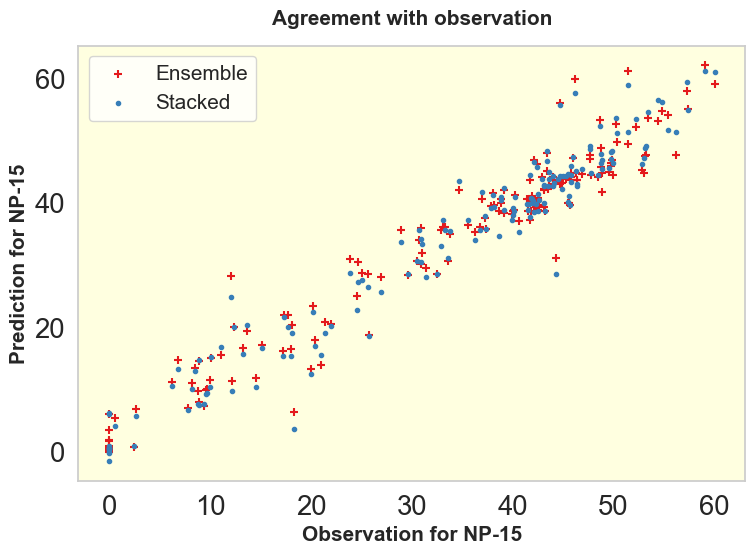

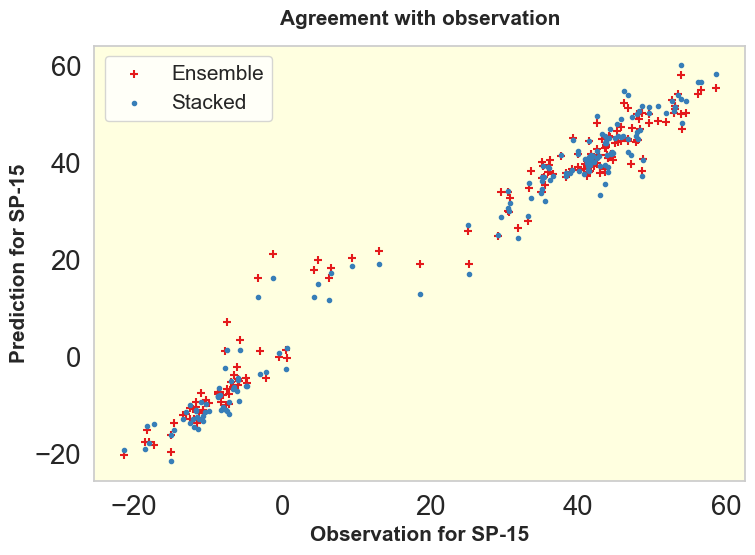

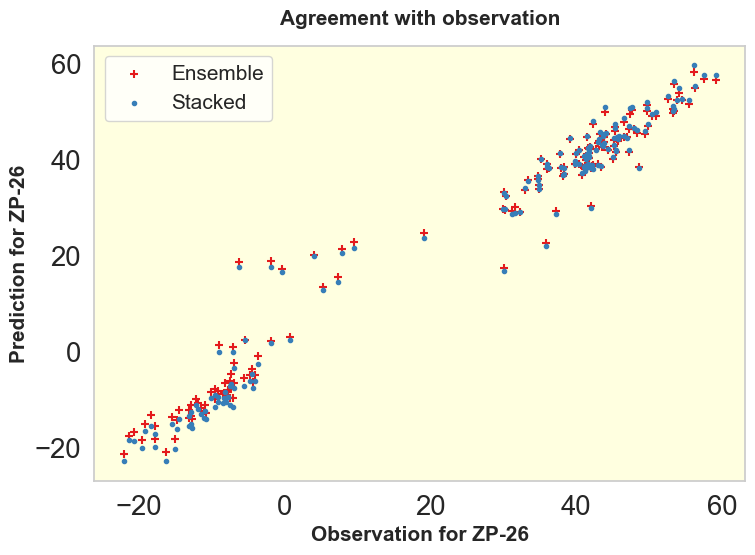

In [82]:
name_prs = ['Ensemble_model', 'Stacked_model']
mss = ['Ensemble', 'Stacked']
status = "modified"
name = "combined_scatter1"

for j in np.arange(len(areas)):
    area = areas[j]

    comp_combined_succ_scatter(area, name_prs, mss, file_path, status, name)

### Combined model
Stacked without volatility vs stacked with volatility: scatterplots(2)

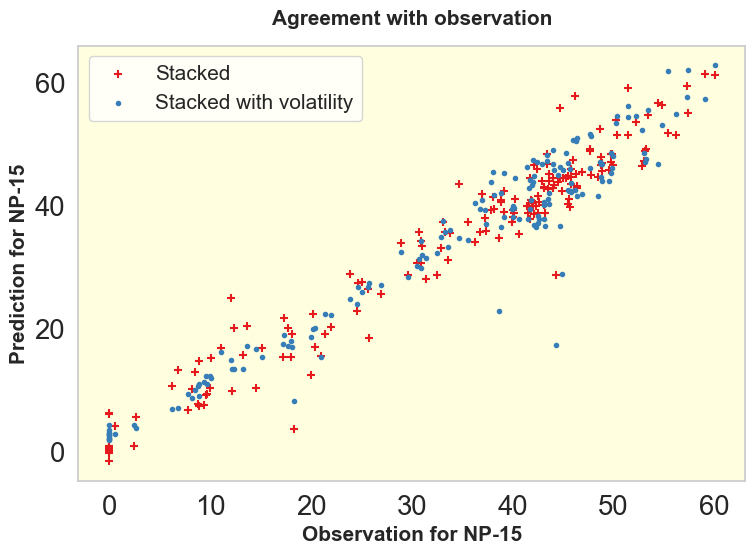

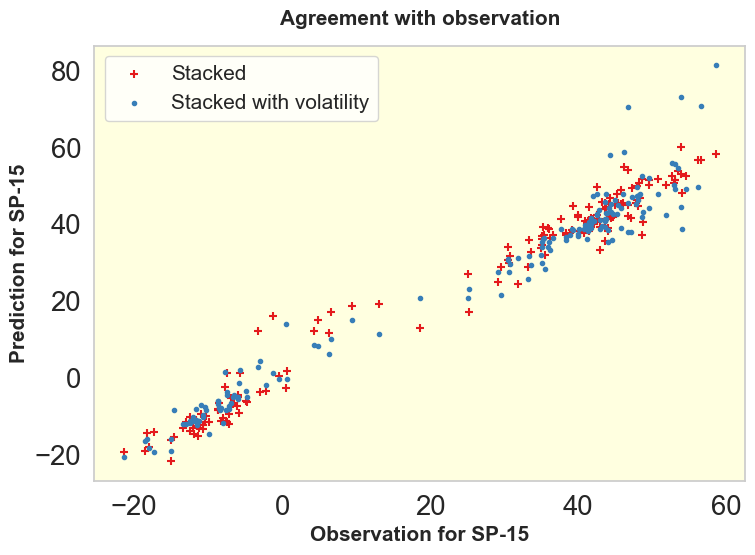

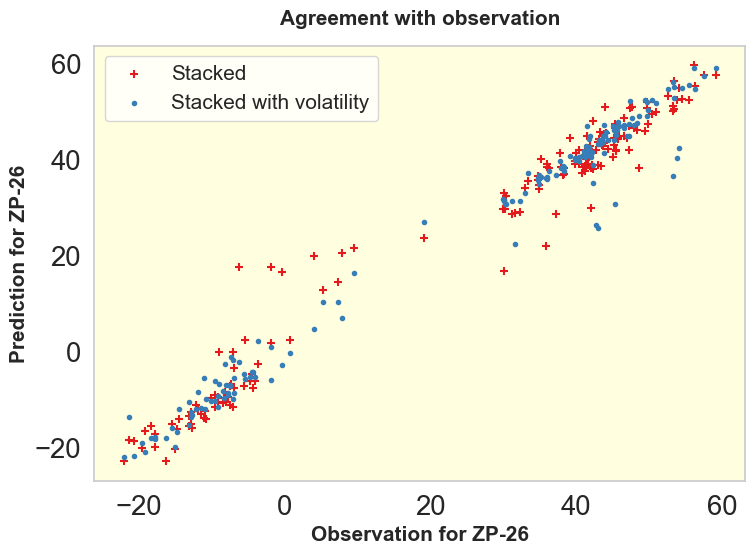

In [80]:
name_prs = ['Stacked_model', 'Stacked_model_with_vol']
mss = ['Stacked', 'Stacked with volatility']
status = "modified"
name = "combined_scatter2"

for j in np.arange(len(areas)):
    area = areas[j]

    comp_combined_succ_scatter(area, name_prs, mss, file_path, status, name)

### Combined model
Ensemble vs Stacked without volatility vs stacked with volatility: scatterall

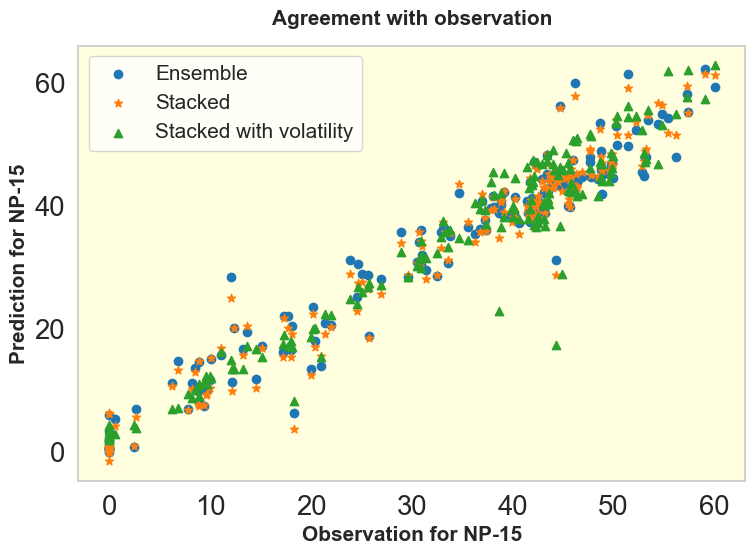

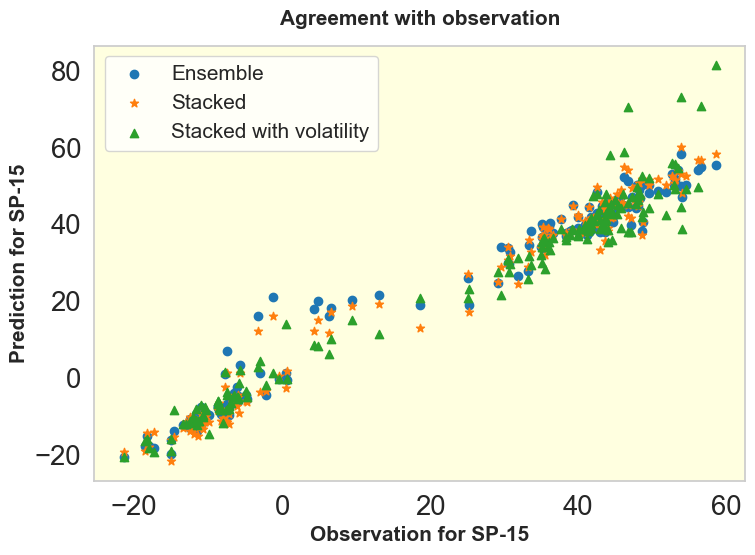

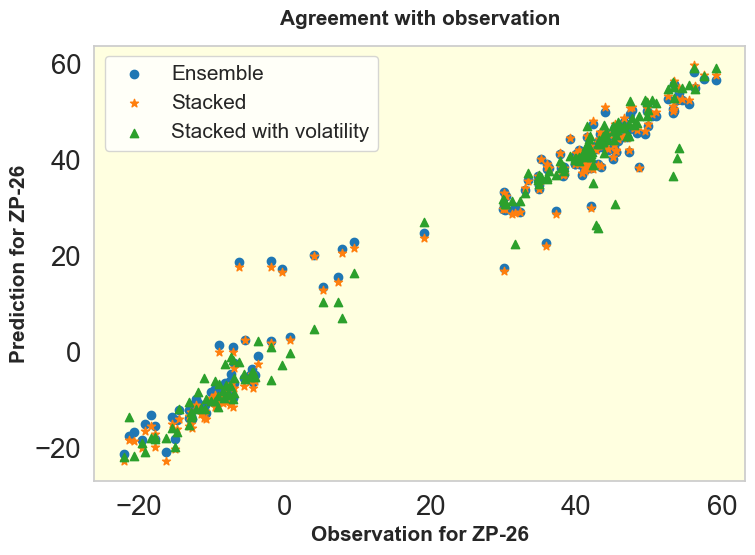

In [40]:
name_prs = ['Ensemble_model', 'Stacked_model', 'Stacked_model_with_vol']
mss = ['Ensemble', 'Stacked', 'Stacked with volatility']
status = "modified"
name = "combined_scatter_all"

for j in np.arange(len(areas)):
    area = areas[j]

    comp_combined_succ_scatter(area, name_prs, mss, file_path, status, name)

### Combined model - Error estimates

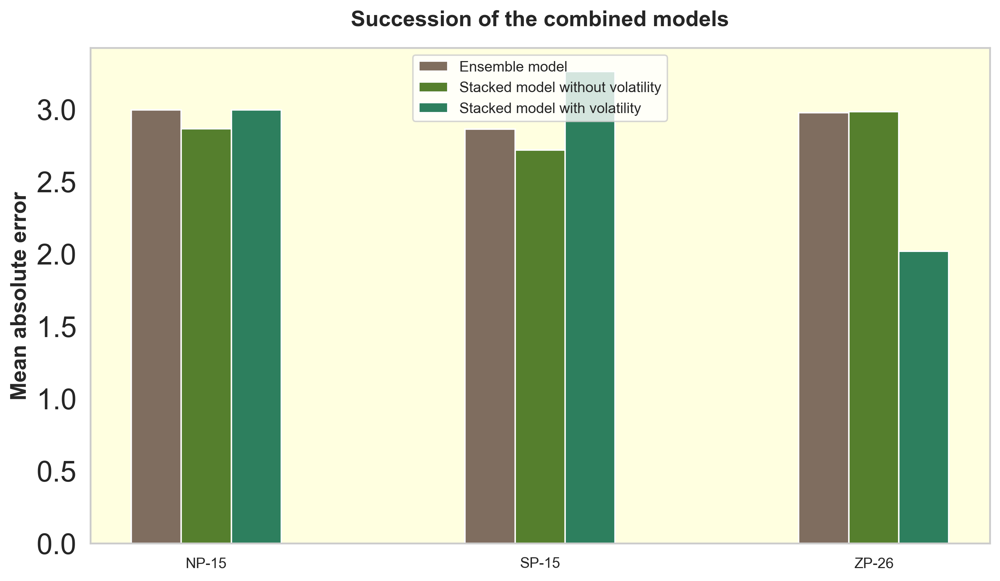

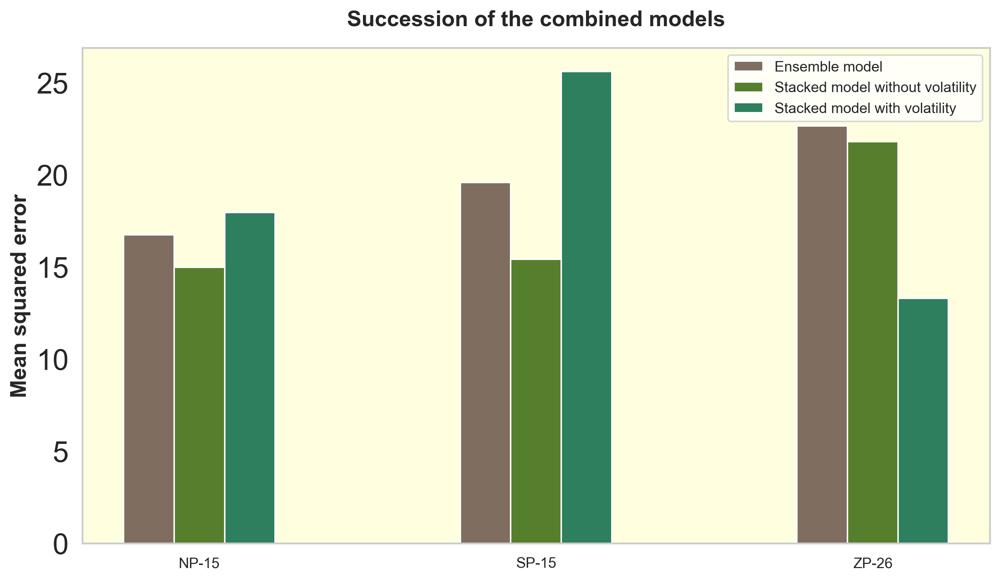

In [42]:
name_prs = ['Ensemble_model', 'Stacked_model', 'Stacked_model_with_vol']
mss = ['Ensemble model', 'Stacked model without volatility', 'Stacked model with volatility']

get_combined_barplots(file_path, name_prs, mss, areas, 'mae', 'Mean absolute error', var1='Actual', var2='Prediction', barWidth=0.15, status='modified')
get_combined_barplots(file_path, name_prs, mss, areas, 'mse', 'Mean squared error', var1='Actual', var2='Prediction', barWidth=0.15, status='modified')

### Error measures for successive combined models

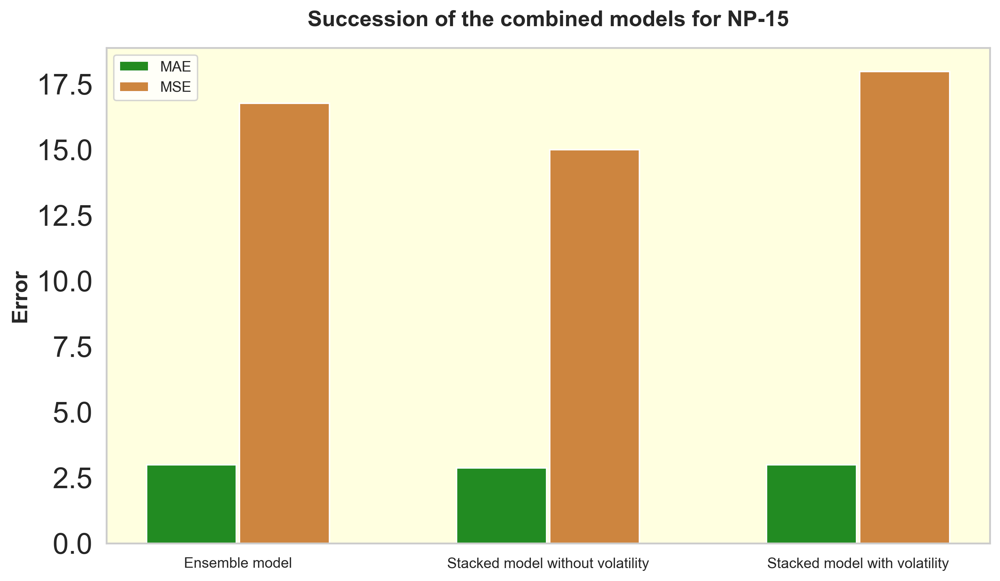

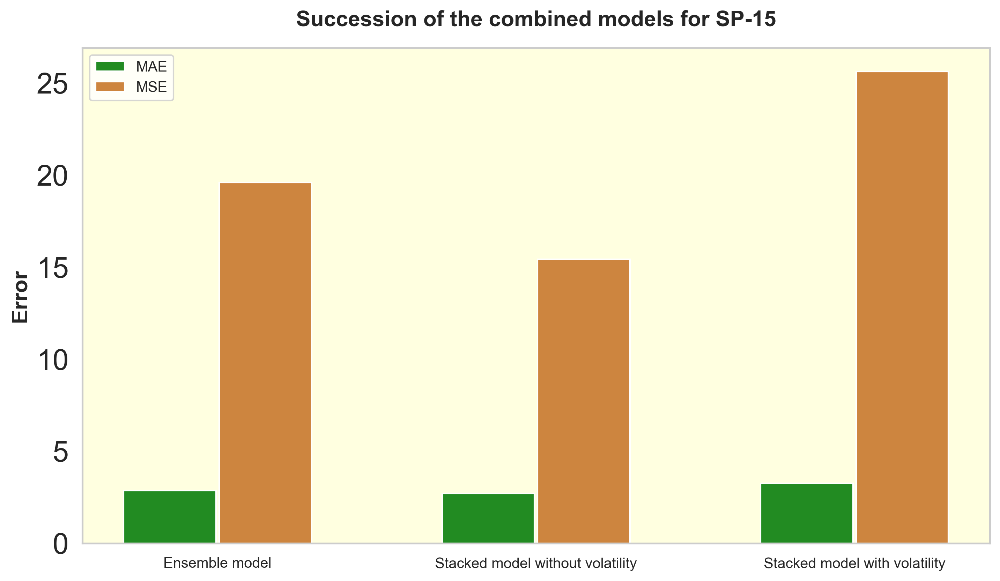

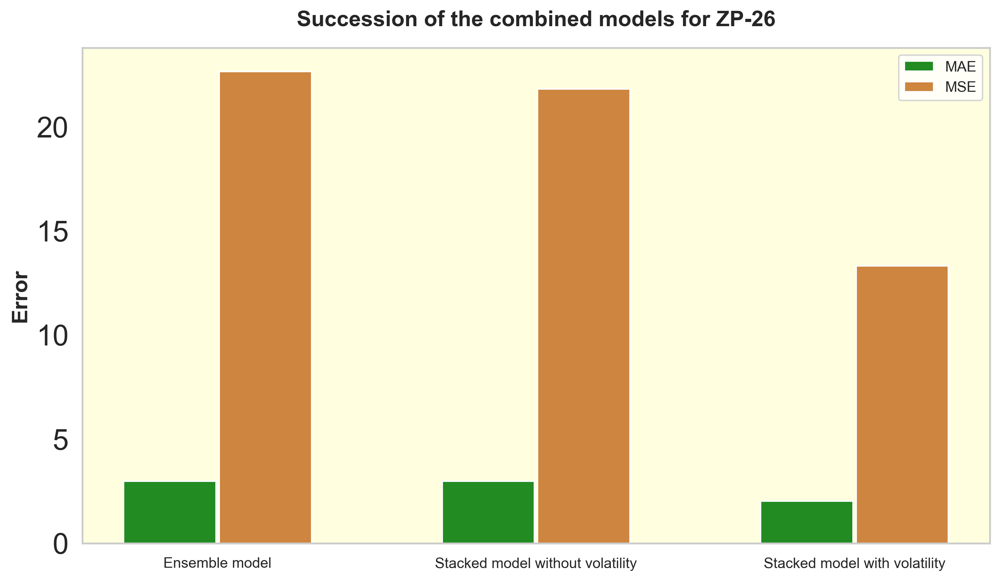

In [44]:
bar_colors = ['forestgreen', 'peru']
name_prs = ['Ensemble_model', 'Stacked_model', 'Stacked_model_with_vol']
mss = ['Ensemble model', 'Stacked model without volatility', 'Stacked model with volatility']
status = 'modified'

x1 = np.arange(len(name_prs))
x2 = x1 - barWidth
x3 = x1 + barWidth
x = [x1, x2, x3]

for j in np.arange(len(areas)):
    area = areas[j]

    err_mae = []
    err_mse = []
    
    fig, ax = plt.subplots(figsize=(10,6), dpi=300)
    
    for k in np.arange(len(name_prs)):
        name_pr = name_prs[k]
        ms = mss[k]

        df = pd.read_csv(file_path + name_pr + '_' + area + '.csv', index_col='Unnamed: 0')
        df.index = pd.to_datetime(df.index)
            
        err_mae.append(mean_absolute_error(df['Actual'], df['Prediction']))
        err_mse.append(mean_squared_error(df['Actual'], df['Prediction']))
    
    ax.bar(x2, err_mae, width=0.29, color=bar_colors[0], edgecolor='white', label='MAE')
    ax.bar(x3, err_mse, width=0.29, color=bar_colors[1], edgecolor='white', label='MSE')
    
    ax.set_xticks(x1)
    ax.set_xticklabels(mss, fontsize=10)
    ax.set_ylabel('Error', fontsize=15)
    ax.set_title(f'Succession of the combined models for {area}', fontsize=15)
    ax.legend(fontsize=10)
    ax.grid(False)
    ax.set_facecolor('lightyellow')
    plt.savefig(figpath + "Combined_model_succ_bar_" + area + "_" + status + ".png", bbox_inches="tight", pad_inches=0.3)

### Bar plots for post

Have both error measures as bar plot. 1 plot per area.

### Improvements through models - simple, ensemble, stacked, volatility

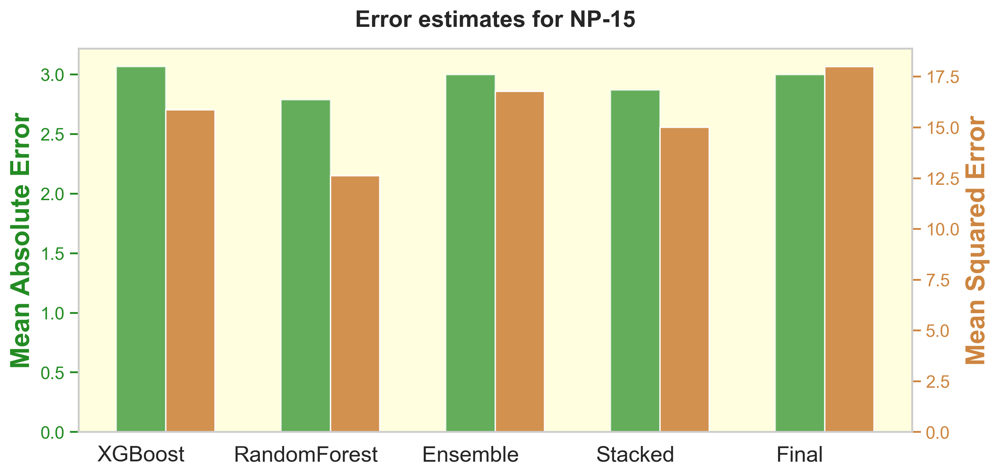

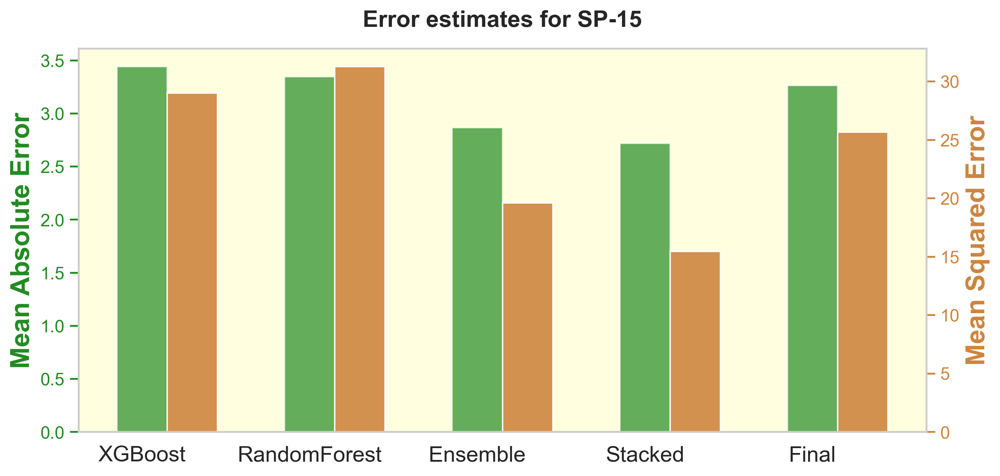

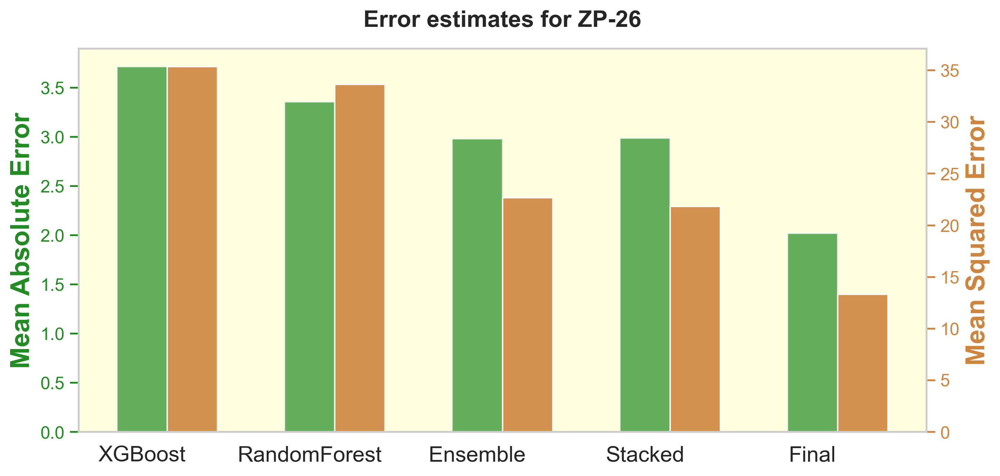

In [47]:
bar_colors = ['forestgreen', 'peru']
status = 'final'

name_prs = ['Simple_XGB', 'Simple_RF', 'Ensemble_model', 'Stacked_model', 'Stacked_model_with_vol']
mss = ['XGBoost', 'RandomForest',  'Ensemble', 'Stacked', 'Final']

x1 = np.arange(len(name_prs))
x2 = x1 - barWidth
x3 = x1 + barWidth

for j in np.arange(len(areas)):
    area = areas[j]

    err_mae = []
    err_mse = []
    
    fig, ax1 = plt.subplots(figsize=(10,5), dpi=300)
    ax2 = ax1.twinx()

    for k in np.arange(len(name_prs)):
        name_pr = name_prs[k]
        ms = mss[k]

        df = pd.read_csv(file_path + name_pr + '_' + area + '.csv', index_col='Unnamed: 0')
        df.index = pd.to_datetime(df.index)
            
        err_mae.append(mean_absolute_error(df['Actual'], df['Prediction']))
        err_mse.append(mean_squared_error(df['Actual'], df['Prediction']))
    
    ax1.bar(x2, err_mae, width=0.3, color=bar_colors[0], edgecolor='white', label='MAE', alpha=0.7)
    ax2.bar(x3, err_mse, width=0.3, color=bar_colors[1], edgecolor='white', label='MSE', alpha=0.9)
    ax1.set_ylabel('Mean Absolute Error', color=bar_colors[0], fontsize=18)
    ax2.set_ylabel('Mean Squared Error', color=bar_colors[1], fontsize=18)
    ax1.set_xticks(x2)
    ax1.set_xticklabels(mss, fontsize=15) 
    ax1.tick_params(axis='y', labelsize=12, colors=bar_colors[0])
    ax2.tick_params(axis='y', labelsize=12, colors=bar_colors[1])
    ax1.grid(False)
    ax2.grid(False)
    ax1.set_facecolor('lightyellow')
    ax1.set_title(f'Error estimates for {area}', fontsize=16)
    plt.tight_layout()
    plt.savefig(figpath + "Succ_Model_error_comp_bar_" + area + "_" + status + ".png", bbox_inches="tight", pad_inches=0.3)

### Improvements through simple models to final model

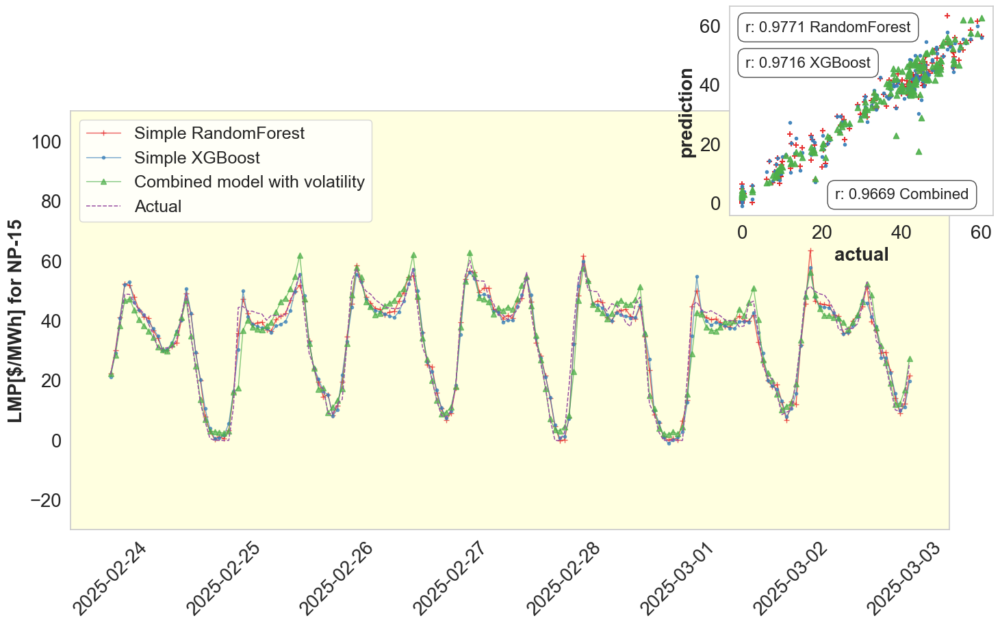

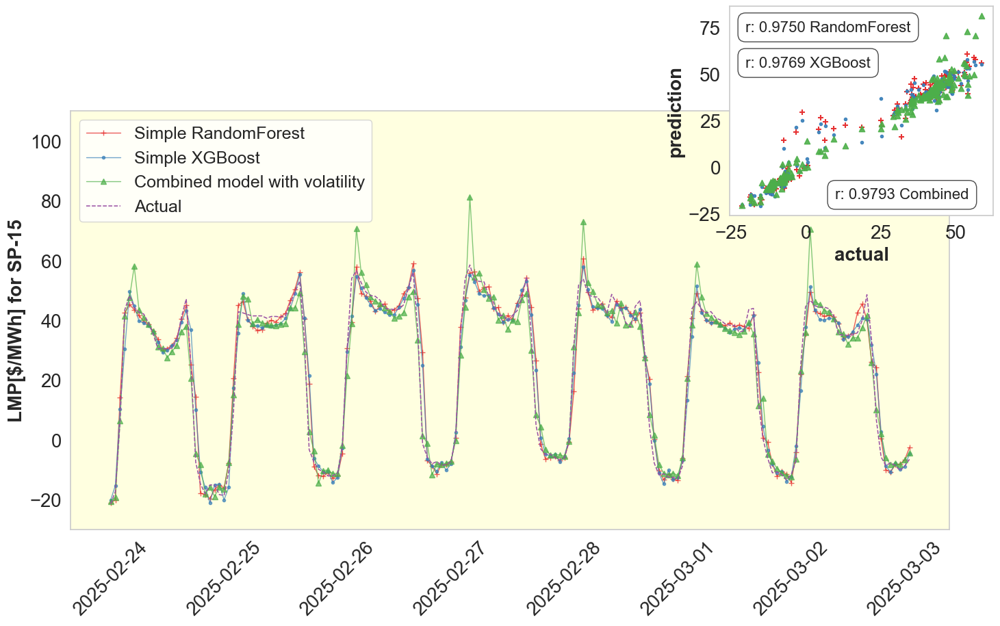

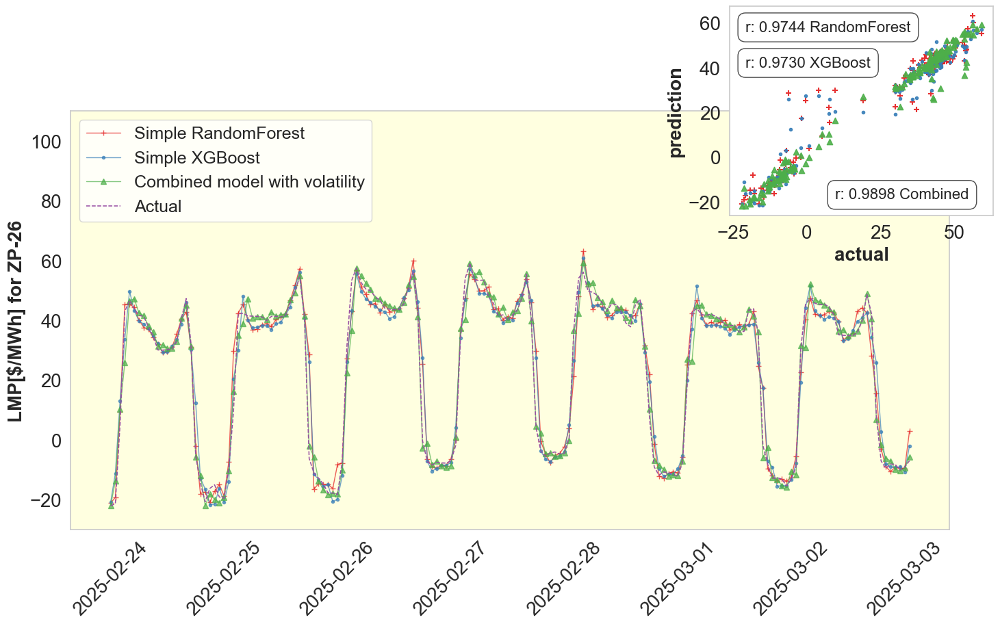

In [49]:
palette = "Set1"
sns.set(style="whitegrid", palette=palette, font_scale=1.8)

intext_x = [0.06, 0.06, 0.40] 
intext_y = [0.88, 0.71, 0.08] 

my_markers = ['+', '.', '^']

status = 'final_improvement'

name_prs = ['Simple_RF', 'Simple_XGB', 'Stacked_model_with_vol']
mss = ['Simple RandomForest', 'Simple XGBoost', 'Combined model with volatility']
intext = ['RandomForest', 'XGBoost', 'Combined']

for j in np.arange(len(areas)):
    area = areas[j]

    fig, ax = plt.subplots(figsize=(15,10))
    inset_ax = ax.inset_axes([0.75, 0.75, 0.3, 0.5])

    for k in np.arange(len(name_prs)):
        name_pr = name_prs[k]
        ms = mss[k]

        df = pd.read_csv(file_path + name_pr + '_' + area + '.csv', index_col='Unnamed: 0')
        df.index = pd.to_datetime(df.index)        
         
        ax.plot(df['Prediction'], ls='-', marker=my_markers[k], lw=1.0, alpha=0.7, label=ms)
        inset_ax.scatter(df['Actual'], df['Prediction'], marker=my_markers[k], alpha=0.9, label=ms)
    
        corr = np.corrcoef(df['Actual'], df['Prediction'])[0, 1]
        inset_ax.text(intext_x[k], intext_y[k], f"r: {corr:.4f} {intext[k]}", transform=inset_ax.transAxes, fontsize=16,
              bbox=dict(facecolor='white', alpha=0.7, edgecolor='black', boxstyle='round,pad=0.5'))
    
    ax.plot(df['Actual'], ls='--', lw=1.1, alpha=1.0, label='Actual')
    ax.legend(loc='upper left', fontsize=18)
    ax.set_ylabel(f'LMP[$/MWh] for {area}', fontsize=20)
    ax.set_ylim([-30, 110])
    ax.grid(False)
    ax.set_facecolor('lightyellow')
    ax.xaxis.set_major_locator(mdates.DayLocator()) 
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d')) 
    ax.set_xticks(df.index[::24])  
    ax.set_xticklabels(df.index[::24].strftime('%Y-%m-%d'), rotation=45)  

    inset_ax.set_xlabel('actual', fontsize=20)
    inset_ax.set_ylabel('prediction', fontsize=20)
    inset_ax.tick_params(axis='both', labelsize=20)
    inset_ax.grid(False)   

    plt.tight_layout()
    plt.savefig(figpath + "Final_Model_comp_with_base_" + area + "_" + status + ".png", bbox_inches="tight", pad_inches=0.3)